# Integration and annotation of WT Drosophila embryonic cells encompassing stage 11 and later


**Purpose**

Preprocessing and integration of multiple wild-type (WT) datasets, followed by a systematic comparison of alternative data integration methods.


**Input**

* Raw gene expression count matrices from four WT datasets. Cells were FACS-sorted Drosophila embryonic cells enriched for RFP-expressing cells under the control of the 48y-Gal4 driver.

* A reference annotation file provided by the Berkeley Drosophila Genome Project (BDGP).



**Workflow Overview**

* Data preprocessing: Each dataset was processed independently. Genes without annotated gene names were removed, as well as genes detected in fewer than three cells.

* Dataset-specific cell type annotation: Cell type annotation was performed separately for each dataset using an overrepresentation analysis based on Fisher’s exact test. The BDGP reference annotation, which contains cell-type-specific gene expression information, was used as the reference. Clustering followed by Wilcoxon rank sum test was performed. Marker genes were selected using an adjusted p-value threshold of < 0.05 and a log2 fold change > 0, focusing on the top 4,000 highly variable genes per dataset.

* Integration method benchmarking: Multiple integration methods, including Harmony, Seurat, BBKNN, Scanorama, and scVI, were evaluated to identify the most suitable approach. Performance was systematically benchmarked using quantitative metrics assessing two key criteria:
(A) batch effect removal, and
(B) cell-type label conservation.

In addition to global metrics, biological coherence of the integration was assessed by examining cell cycle dynamics, highly variable gene patterns, and developmental trajectories, specifically within the midgut population across all four datasets. This benchmarking strategy was adapted from Luecken et al., 2022.

* Selection of the optimal integration method: The integration method demonstrating the best overall performance across technical and biological metrics was selected and used for reclustering and cell type annotation of the integrated dataset.


**Output**

A Harmony-integrated wild-type dataset comprising all four WT samples, accompanied by refined cell type annotations.

**Saved file**
`WT_Harmony.h5ad`


In [ ]:
import os
import random

import numpy as np
import pandas as pd
import scanpy as sc

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import classification_report
from sklearn.metrics.pairwise import cosine_similarity

import warnings
warnings.filterwarnings('ignore')
%load_ext autoreload
%autoreload 2

from scipy.sparse import csr_matrix, issparse

from scipy import io

sc.settings.set_figure_params(dpi=80, frameon=False)
sc.set_figure_params(dpi=80)
sc.set_figure_params(figsize=(4, 4))
plt.rcParams['figure.dpi'] = 80
plt.rcParams['figure.figsize'] = (4, 4)

from scipy.sparse import csr_matrix, issparse

import anndata as ad

# R interface
from rpy2.robjects import pandas2ri
from rpy2.robjects import r
import rpy2.rinterface_lib.callbacks
import anndata2ri

pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

%%R
# R packages
library(Seurat)

In [ ]:
import math
from scipy.stats import hypergeom
from statsmodels.stats.multitest import multipletests


In [ ]:
SEED = 0

os.environ["PYTHONHASHSEED"] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)

In [ ]:
%%R
set.seed(0)
# R packages
library(Seurat)

## Processing each chip separately

#### chip6

In [ ]:
chip6 = sc.read_csv('../data/raw/chips/chip6/analysis_genematrix.csv').T
chip6

In [ ]:
gene_info = pd.read_csv('../data/raw/chips/chip6/gene_info.csv', index_col=0)
gene_info

In [ ]:
chip6.var['Gene_name']=gene_info['Gene_Name']
chip6.var['biotype']=gene_info['Gene_Biotype']
chip6.var['gene_length']=gene_info['Gene_Length']
chip6.var

In [ ]:
chip6.var=chip6.var.set_index(chip6.var['Gene_name'])

In [ ]:
gene_sub = chip6.var.dropna(subset=[chip6.var.index.name])
chip6 = chip6 [:, chip6.var.index.isin(gene_sub.index)].copy()
chip6

In [ ]:
chip6.var['mt'] = chip6.var_names.str.startswith('mt:') 
sc.pp.calculate_qc_metrics(chip6, qc_vars=['mt'], log1p=True, inplace=True)

In [ ]:
np.median(chip6.obs['n_genes_by_counts'])

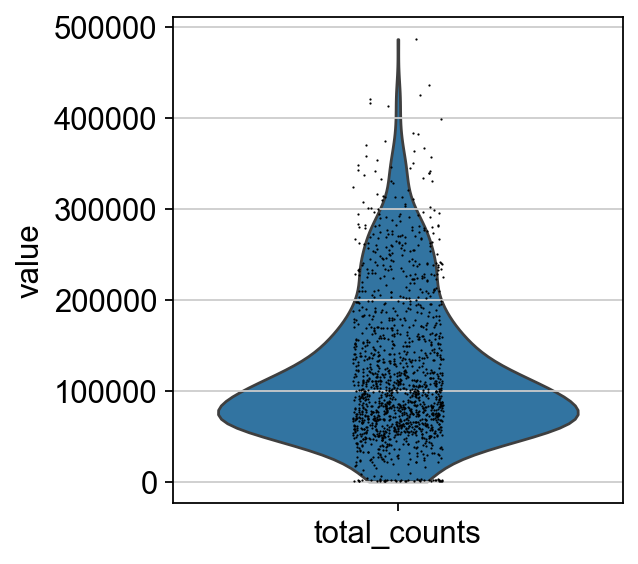

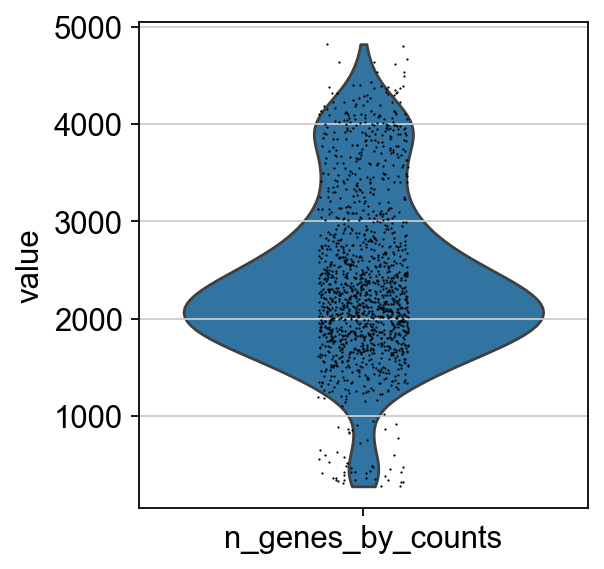

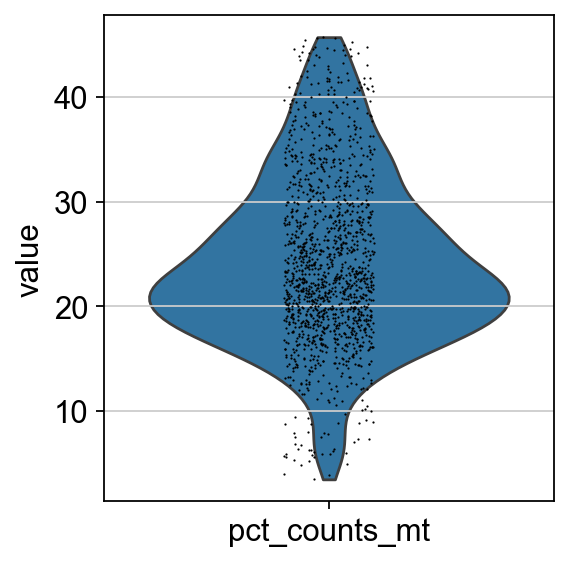

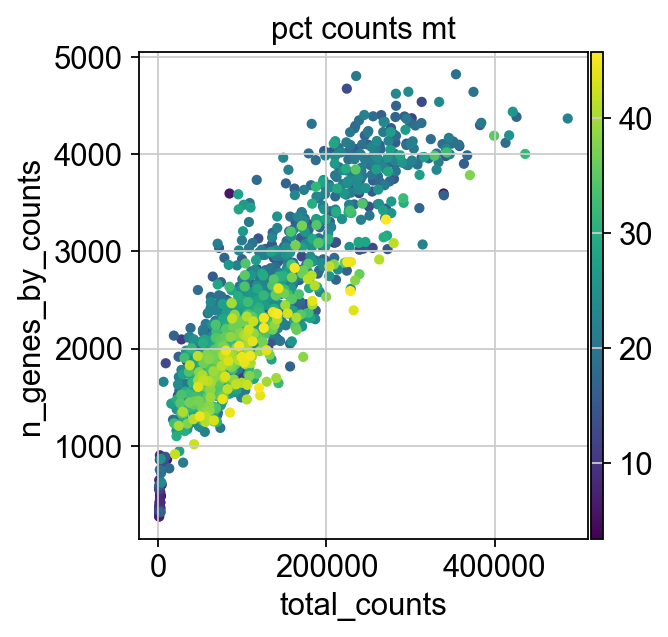

In [12]:
p1 = sc.pl.violin(chip6, 'total_counts')
p2 = sc.pl.violin(chip6, 'n_genes_by_counts')
p3 = sc.pl.violin(chip6, 'pct_counts_mt')
p4 = sc.pl.scatter(chip6, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [ ]:
chip6.layers['raw_counts']=chip6.X.copy()

In [ ]:
chip6.raw=chip6.copy()

#### chip7

In [ ]:
chip7=sc.read_csv('../data/raw/chips/chip7/analysis_genematrix.csv').T
chip7

In [ ]:
gene_info=pd.read_csv('../data/raw/chips/chip7/gene_info.csv', index_col=0)
gene_info

In [ ]:
chip7.var['Gene_name']=gene_info['Gene_Name']
chip7.var['biotype']=gene_info['Gene_Biotype']
chip7.var['gene_length']=gene_info['Gene_Length']
chip7.var

In [ ]:
chip7.var=chip7.var.set_index(chip7.var['Gene_name'])

In [ ]:
gene_sub = chip7.var.dropna(subset=[chip7.var.index.name])
chip7 = chip7 [:, chip7.var.index.isin(gene_sub.index)].copy()
chip7

In [ ]:
chip7.var['mt'] = chip7.var_names.str.startswith('mt:') 
sc.pp.calculate_qc_metrics(chip7, qc_vars=['mt'], log1p=True, inplace=True)

In [ ]:
chip7.raw = chip7.copy()

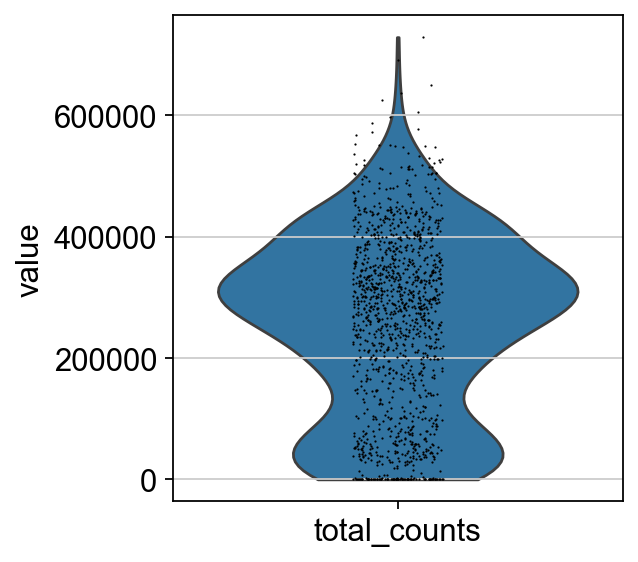

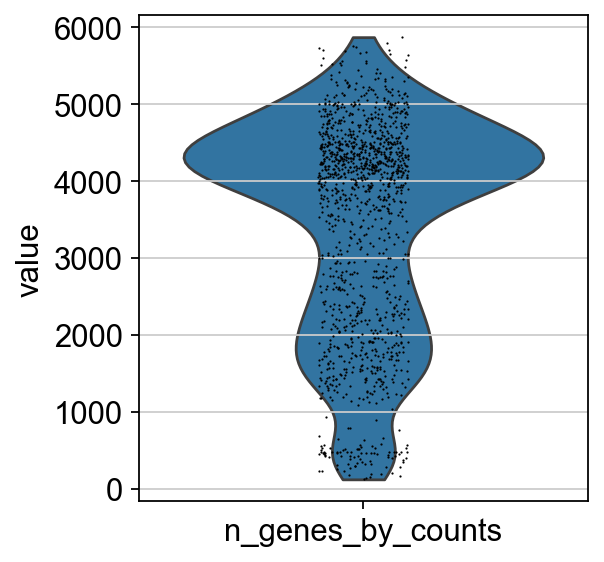

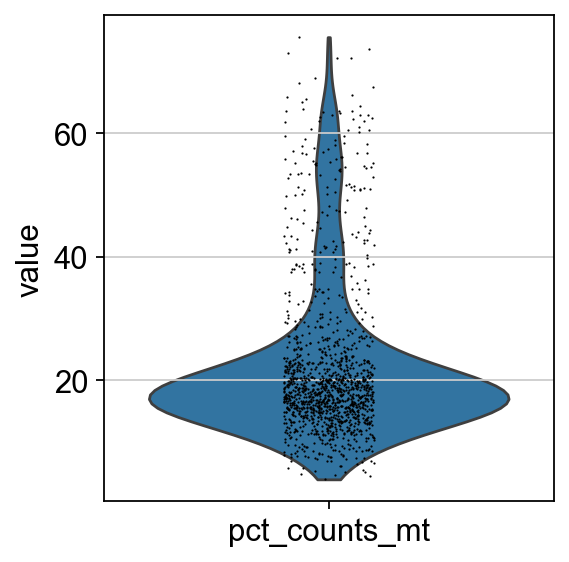

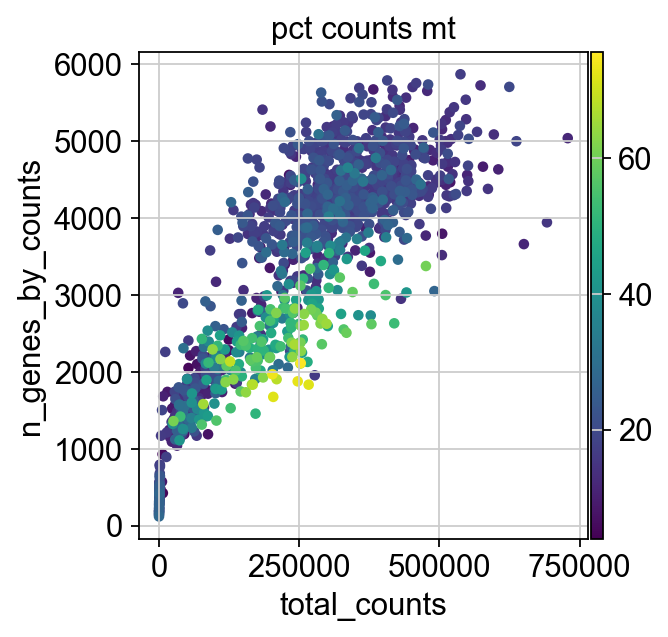

In [22]:
p1 =  sc.pl.violin(chip7, 'total_counts')
p2 = sc.pl.violin(chip7, 'n_genes_by_counts')
p3 = sc.pl.violin(chip7, "pct_counts_mt")
p4 = sc.pl.scatter(chip7, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [ ]:
cell_info=pd.read_csv('../data/raw/chips/chip7/analysis_stats.csv', index_col=0)
cell_info

In [ ]:
chip7.obs['sample']=cell_info['Sample']

In [ ]:
chip7.obs['sample'].value_counts()

In [ ]:
sc.pp.filter_genes(chip7, min_cells=3)
chip7

In [ ]:
chip7.layers['raw_counts']=chip7.X.copy()

#### chip8

In [ ]:
chip8=sc.read_csv('../data/raw/chips/chip8/analysis_p1375Chip1_genematrix.csv').T
chip8

In [ ]:
gene_info=pd.read_csv('../data/raw/chips/chip8/gene_info.csv', index_col=0)
gene_info

In [ ]:
chip8.var['Gene_name']=gene_info['Gene_Name']
chip8.var['biotype']=gene_info['Gene_Biotype']
chip8.var['gene_length']=gene_info['Gene_Length']
chip8.var

In [ ]:
chip8.var=chip8.var.set_index(chip8.var['Gene_name'])

In [ ]:
gene_sub = chip8.var.dropna(subset=[chip8.var.index.name])
chip8 = chip8 [:, chip8.var.index.isin(gene_sub.index)].copy()
chip8

In [ ]:
chip8.var['mt'] = chip8.var_names.str.startswith('mt:') 
sc.pp.calculate_qc_metrics(chip8, qc_vars=['mt'], log1p=True, inplace=True)

In [ ]:
chip8.raw = chip8.copy()

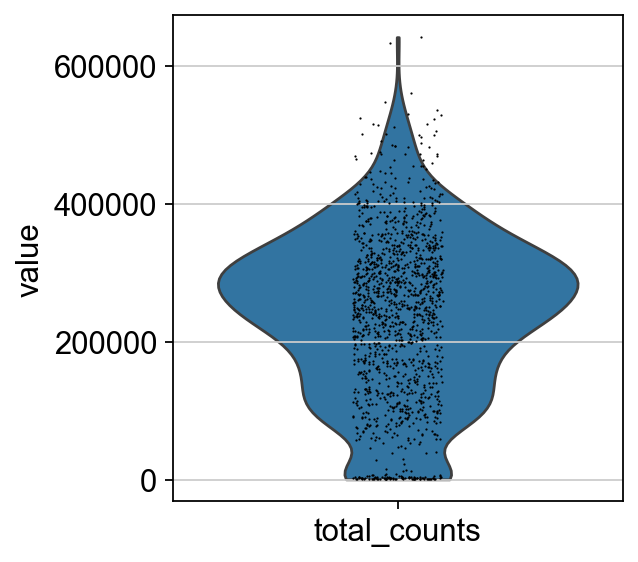

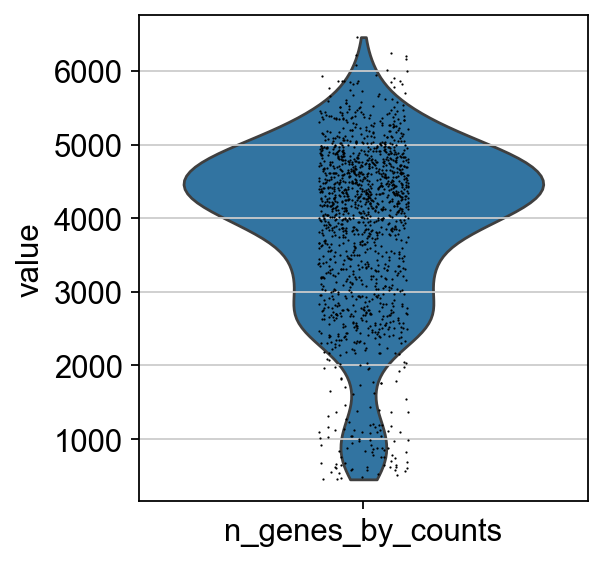

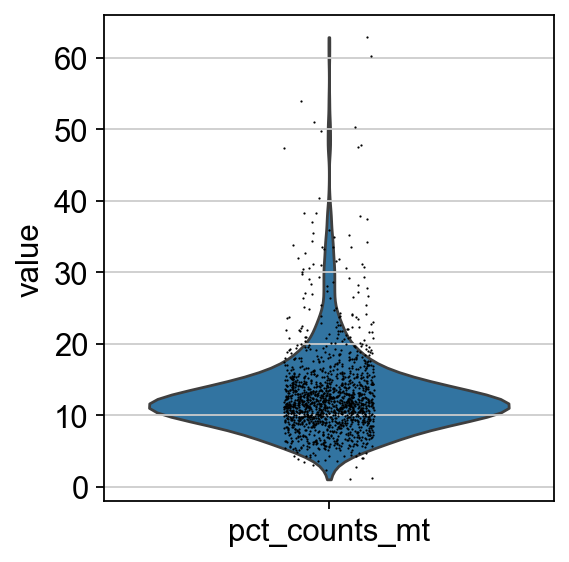

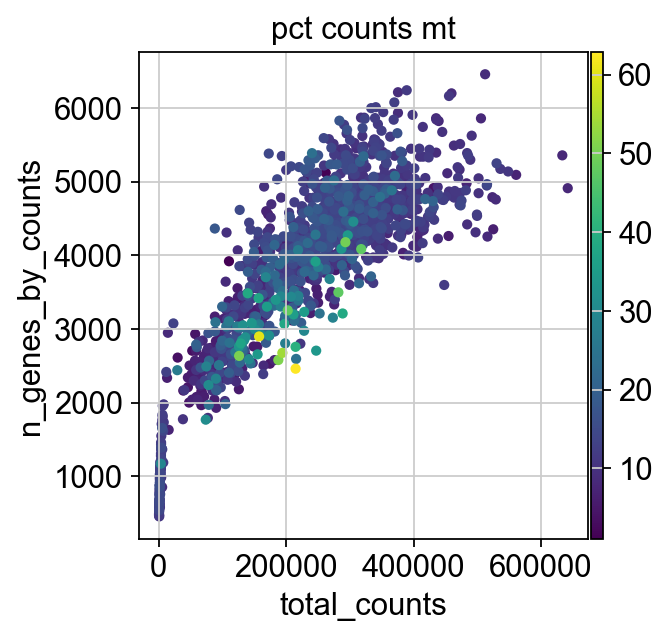

In [35]:
p1 =  sc.pl.violin(chip8, 'total_counts')
p2 = sc.pl.violin(chip8, 'n_genes_by_counts')
p3 = sc.pl.violin(chip8, "pct_counts_mt")
p4 = sc.pl.scatter(chip8, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [ ]:
cell_info=pd.read_csv('../data/raw/chips/chip8/analysis_p1375Chip1_stats.csv', index_col=0)
cell_info

In [ ]:
chip8.obs['sample']=cell_info['Sample']

In [ ]:
chip8.obs['sample'].value_counts()

In [ ]:
sc.pp.filter_genes(chip8, min_cells=3)
chip8

In [ ]:
chip8.layers['raw_counts']=chip8.X.copy()

#### chip9

In [ ]:
chip9=sc.read_csv('../data/raw/chips/chip9/analysis_genematrix.csv').T
chip9

In [ ]:
gene_info=pd.read_csv('../data/raw/chips/chip9/gene_info.csv', index_col=0)
gene_info

In [ ]:
chip9.var['Gene_name']=gene_info['Gene_Name']
chip9.var['biotype']=gene_info['Gene_Biotype']
chip9.var['gene_length']=gene_info['Gene_Length']
chip9.var

In [ ]:
chip9.var=chip9.var.set_index(chip9.var['Gene_name'])

In [ ]:
gene_sub = chip9.var.dropna(subset=[chip9.var.index.name])
chip9 = chip9 [:, chip9.var.index.isin(gene_sub.index)].copy()
chip9

In [ ]:
chip9.var['mt'] = chip9.var_names.str.startswith('mt:') 
sc.pp.calculate_qc_metrics(chip9, qc_vars=['mt'], log1p=True, inplace=True)

In [ ]:
chip9.raw = chip9.copy()

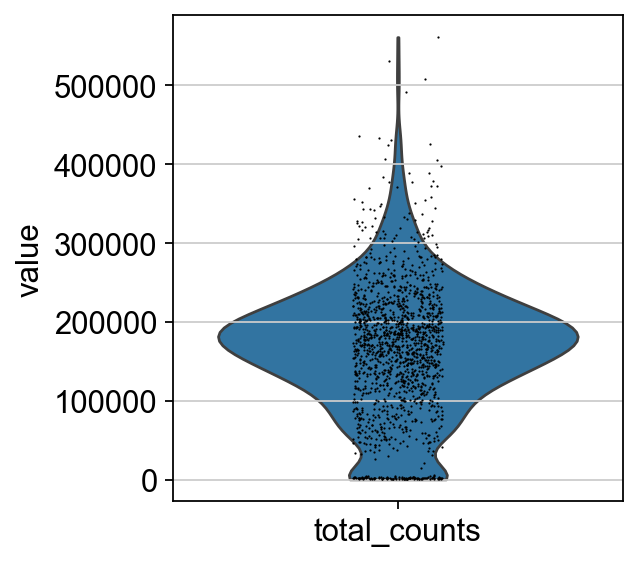

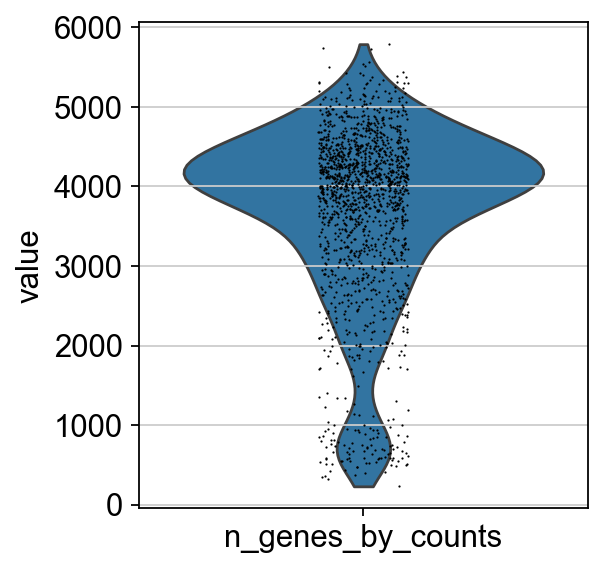

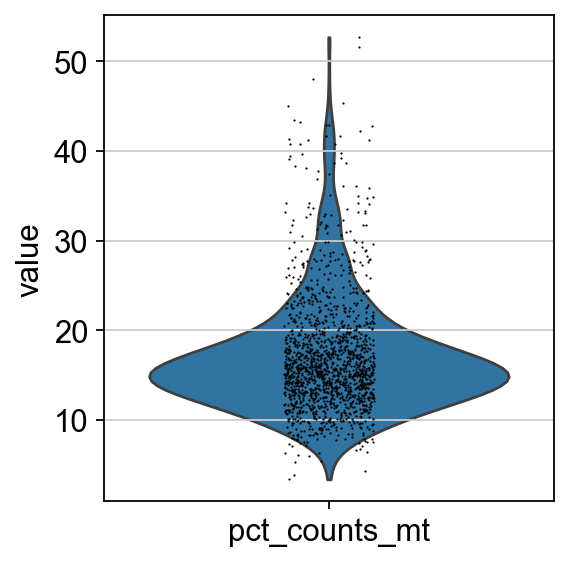

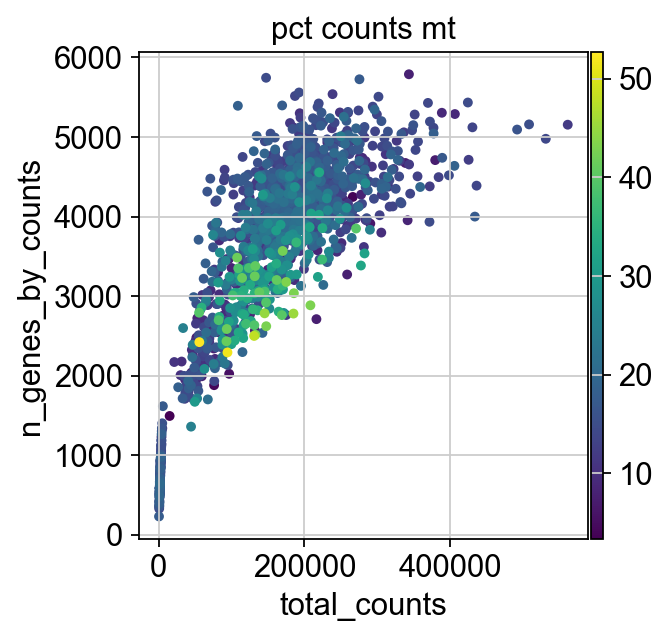

In [48]:
p1 =  sc.pl.violin(chip9, 'total_counts')
p2 = sc.pl.violin(chip9, 'n_genes_by_counts')
p3 = sc.pl.violin(chip9, "pct_counts_mt")
p4 = sc.pl.scatter(chip9, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [ ]:
cell_info=pd.read_csv('../data/raw/chips/chip9/analysis_stats.csv', index_col=0)
cell_info

In [ ]:
chip9.obs['sample']=cell_info['Sample']

In [ ]:
chip9.obs['sample'].value_counts()

In [ ]:
sc.pp.filter_genes(chip9, min_cells=3)
chip9

In [ ]:
chip9.layers['raw_counts']=chip9.X.copy()

In [ ]:
chips = {'chip6': chip6, 'chip7': chip7, 'chip8': chip8, 'chip9': chip9}
for name, chip in chips.items():
    print(f"Median of total counts in {name}: {np.median(chip.obs['total_counts'])}")

In [ ]:
chips = {'chip6': chip6, 'chip7': chip7, 'chip8': chip8, 'chip9': chip9}
for name, chip in chips.items():
    print(f"Median of number of genes per cell in {name}: {np.median(chip.obs['n_genes_by_counts'])}")

### DimRed

In [ ]:
chips = [chip6, chip7, chip8, chip9]
for chip in chips:
    sc.pp.normalize_total(chip)
    sc.pp.log1p(chip)
    sc.pp.pca(chip)
    sc.pp.neighbors(chip, n_pcs=30)
    sc.tl.umap(chip)

In [ ]:
for chip in chips:
    sc.tl.leiden(chip, resolution=0.1, key_added='leiden_0.1')
    sc.tl.leiden(chip, resolution=0.2, key_added='leiden_0.2')

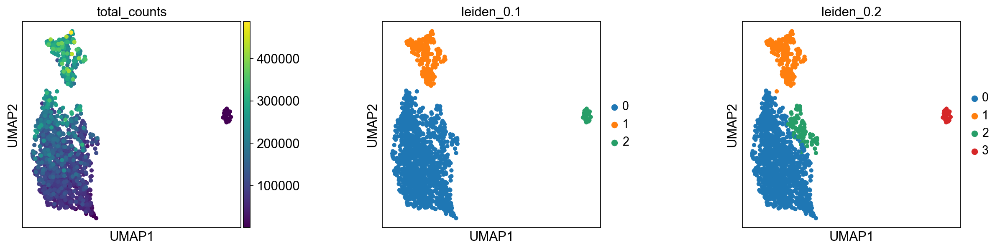

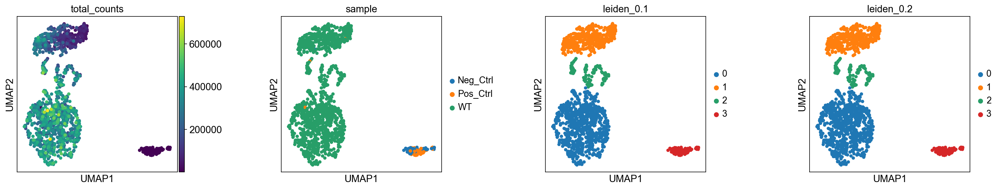

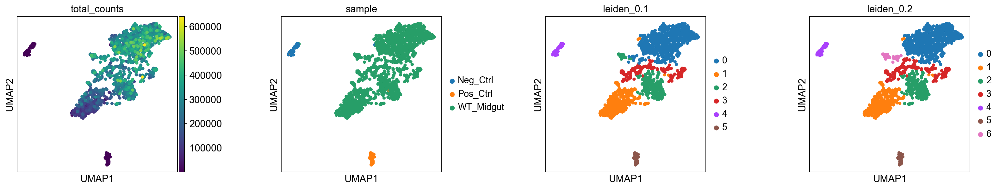

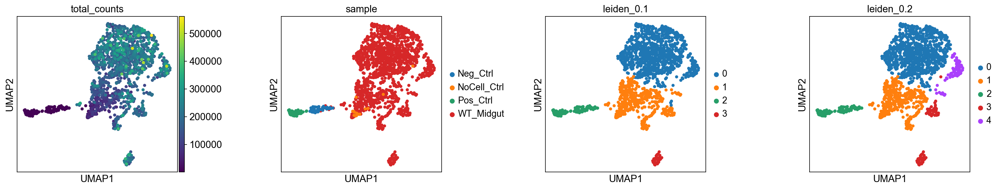

In [58]:
p1 = sc.pl.umap(chip6, color=['total_counts', 'leiden_0.1', 'leiden_0.2'], wspace=0.5)
p2 = sc.pl.umap(chip7, color=['total_counts', 'sample', 'leiden_0.1', 'leiden_0.2'], wspace=0.5)
p3 = sc.pl.umap(chip8, color=['total_counts', 'sample', 'leiden_0.1', 'leiden_0.2'], wspace=0.5)
p4 = sc.pl.umap(chip9, color=['total_counts', 'sample', 'leiden_0.1', 'leiden_0.2'], wspace=0.5)

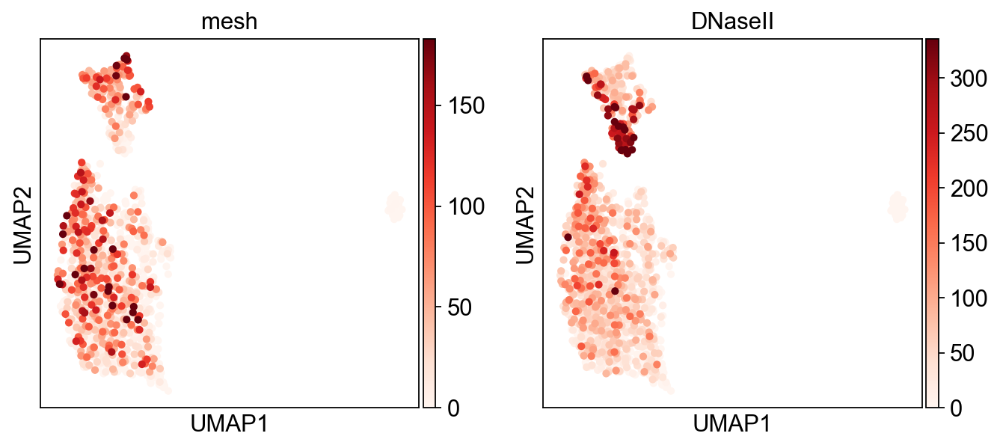

In [59]:
sc.pl.umap(chip6, color=['mesh', 'DNaseII'], vmax='p99', cmap='Reds')

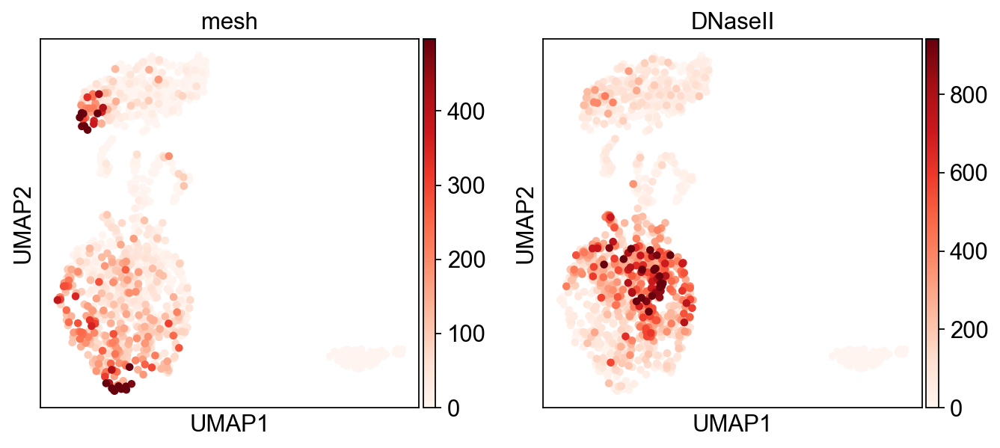

In [60]:
sc.pl.umap(chip7, color=['mesh', 'DNaseII'], vmax='p99', cmap='Reds')

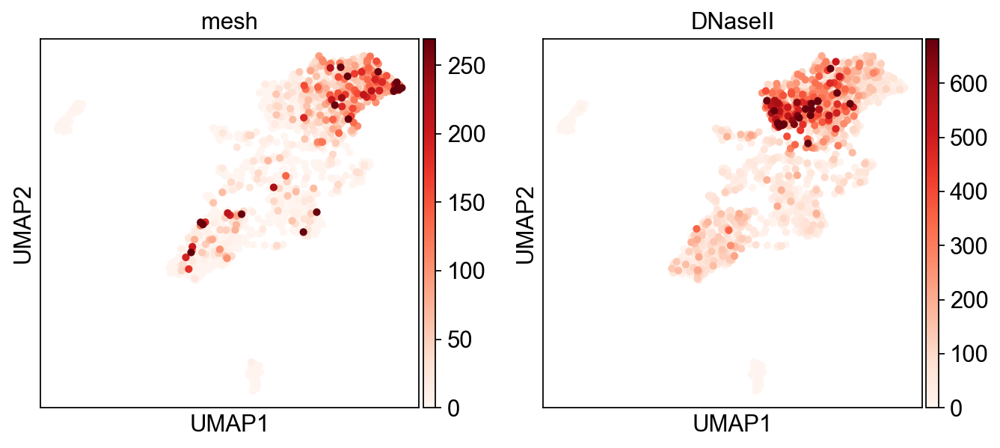

In [61]:
sc.pl.umap(chip8, color=['mesh', 'DNaseII'], vmax='p99', cmap='Reds')

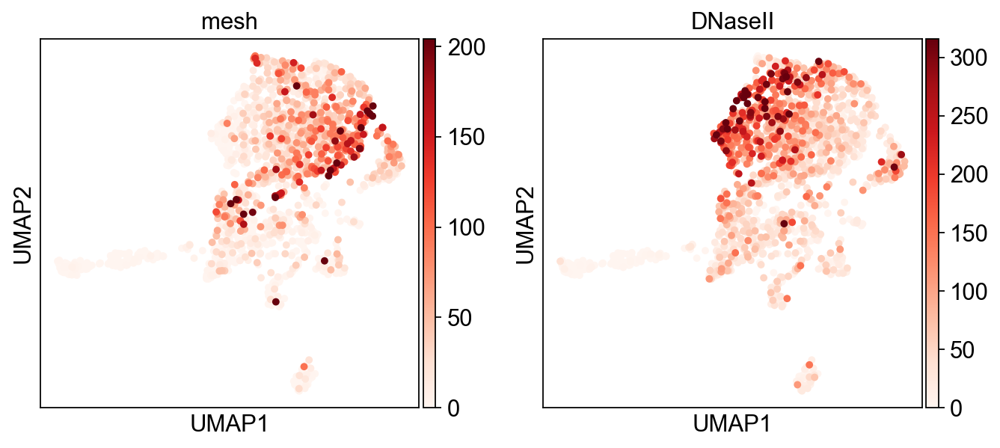

In [62]:
sc.pl.umap(chip9, color=['mesh', 'DNaseII'], vmax='p99', cmap='Reds')

In [ ]:
g2m=pd.read_csv('../data/external/G2MMarkers.txt', header=None)
g2m

In [ ]:
sphase=pd.read_csv('../data/external/SPhaseMarkers.txt', header=None)
sphase

In [ ]:
chips = [chip6, chip7, chip8, chip9]
for chip in chips:
    sc.tl.score_genes_cell_cycle(chip, s_genes=sphase[0].tolist(), g2m_genes=g2m[0].tolist())

In [ ]:
p1 = sc.pl.umap(chip6, color = ['S_score', 'G2M_score', 'phase'])
p2 = sc.pl.umap(chip7, color = ['S_score', 'G2M_score', 'phase'])
p3 = sc.pl.umap(chip8, color = ['S_score', 'G2M_score', 'phase'])
p4 = sc.pl.umap(chip9, color = ['S_score', 'G2M_score', 'phase'])

### chip6 annotation

In [ ]:
sc.tl.leiden(chip6, restrict_to=['leiden_0.2', ['0']], resolution=0.2, key_added='leiden_0.2_sub')

In [ ]:
sc.pl.umap(chip6, color='leiden_0.2_sub')

In [ ]:
sc.tl.leiden(chip6, restrict_to=['leiden_0.2_sub', ['0,1']], resolution=0.3, key_added='leiden_0.2_sub_sub')

In [ ]:
sc.pl.umap(chip6, color='leiden_0.2_sub_sub')

In [ ]:
chip6_hvg = chip6.copy()

In [ ]:
chip6_hvg.X

In [ ]:
sc.pp.highly_variable_genes(chip6_hvg, n_top_genes=4000)
chip6_hvg

In [ ]:
chip6_hvg = chip6_hvg[:, chip6_hvg.var['highly_variable']]
chip6_hvg

In [ ]:
chip6.obs['leiden_0.2_sub_sub'].value_counts()

In [ ]:
sc.tl.rank_genes_groups(chip6_hvg, groupby='leiden_0.2_sub_sub', method='wilcoxon', use_raw=False)

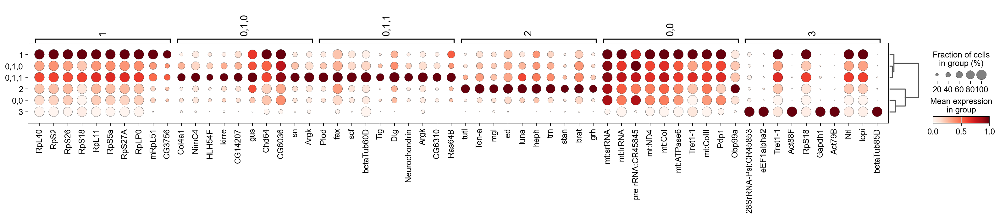

In [77]:
sc.pl.rank_genes_groups_dotplot(chip6_hvg, standard_scale='var', n_genes=10)

In [ ]:
wilcoxon_results6= chip6_hvg.uns['rank_genes_groups']
wilcoxon_results6

In [ ]:
gene_names = wilcoxon_results6['names']
scores = wilcoxon_results6['scores']
pvals_adj = wilcoxon_results6['pvals_adj']
logfoldchanges = wilcoxon_results6['logfoldchanges']

In [ ]:
#prepare a dictionary to store the data
result_dict6 = {'Gene': [], 'Comparison': [], 'Score': [], 'Adj P-value': [], 'Log fold change': []}

In [ ]:
for i in range(len(gene_names)):
    for j in range(len(gene_names[i])):
        result_dict6['Gene'].append(gene_names[i][j])
        result_dict6['Comparison'].append(gene_names.dtype.names[j])
        result_dict6['Score'].append(scores[i][j])
        result_dict6['Adj P-value'].append(pvals_adj[i][j])
        result_dict6['Log fold change'].append(logfoldchanges[i][j])

In [ ]:
wilcoxon_results_df6=pd.DataFrame(result_dict6)

In [ ]:
wilcoxon_results_df6

#### step-by-step process

In [ ]:
chip6_hvg

In [ ]:
### in situ hyb dataset
data = pd.read_csv("../data/external/insitu_annot (1).csv", names=["Annotation_symbol", "Gene", "FlyBaseID", "Stage", "Annotation"])

# Remove rows where "Gene" column is NaN
data = data.dropna(subset=["Gene"])

# Remove rows with the annotation "no staining"
data = data[data["Annotation"] != "no staining"]

In [ ]:
#filter out genes that are not among HVGs in my dataset
data_sub = data[data['Gene'].isin(list(chip6_hvg.var_names))]

# Create the reference gene set
reference_set = data_sub.groupby("Annotation")["Gene"].apply(list).to_dict()

# Display the reference set
for annotation, genes in reference_set.items():
    print(f"{annotation}: {genes}")

In [ ]:
# Filter the data based on conditions
filtered_data = wilcoxon_results_df6[(wilcoxon_results_df6["Log fold change"] > 0) & (wilcoxon_results_df6["Adj P-value"] < 0.05)]

# Group by "Comparison" to create separate DataFrames
comparison_dfs = {comp: df for comp, df in filtered_data.groupby("Comparison")}
de_gene_lists = {comp: df["Gene"].tolist() for comp, df in filtered_data.groupby("Comparison")}

# Display the filtered dataframes (optional)
for comparison, df in comparison_dfs.items():
    print(f"Comparison: {comparison}, Number of Genes: {len(df)}")
    print(df.head())

In [ ]:
all_genes = chip6_hvg.var_names.to_list()

In [ ]:
def hypergeometric_test(query_genes, ref_genes, background_genes):
    # Calculate variables
    N = len(background_genes)  # Total background genes
    n = len(query_genes)  # Query genes
    
    # Results storage
    results = []

    for tissue, ref_set in ref_genes.items():
        M = len(ref_set)  # Genes in the reference set
        k = len(set(query_genes) & set(ref_set))  # Overlap
        
        # Hypergeometric test
        p_value = hypergeom.sf(k-1, N, M, n)  # P(X >= k)
        results.append({'Tissue': tissue, 'Overlap': k, 'Query Size': n, 
                        'Ref Size': M, 'Background Size': N, 'P-Value': p_value})

    # Convert to DataFrame
    results_df = pd.DataFrame(results)
    
    # Adjust p-values (Benjamini-Hochberg)
    results_df['Adjusted P-Value'] = multipletests(results_df['P-Value'], method='fdr_bh')[1]

    return results_df.sort_values(by='Adjusted P-Value')
'''
# Example inputs
query_genes = de_gene_lists['1']
background_genes = all_genes
ref_genes = reference_set

# Run ORA
results = hypergeometric_test(query_genes, ref_genes, background_genes)

# Display results
print(results)
'''

All plots saved to ../figures/chip6_annotation_dotplot.pdf


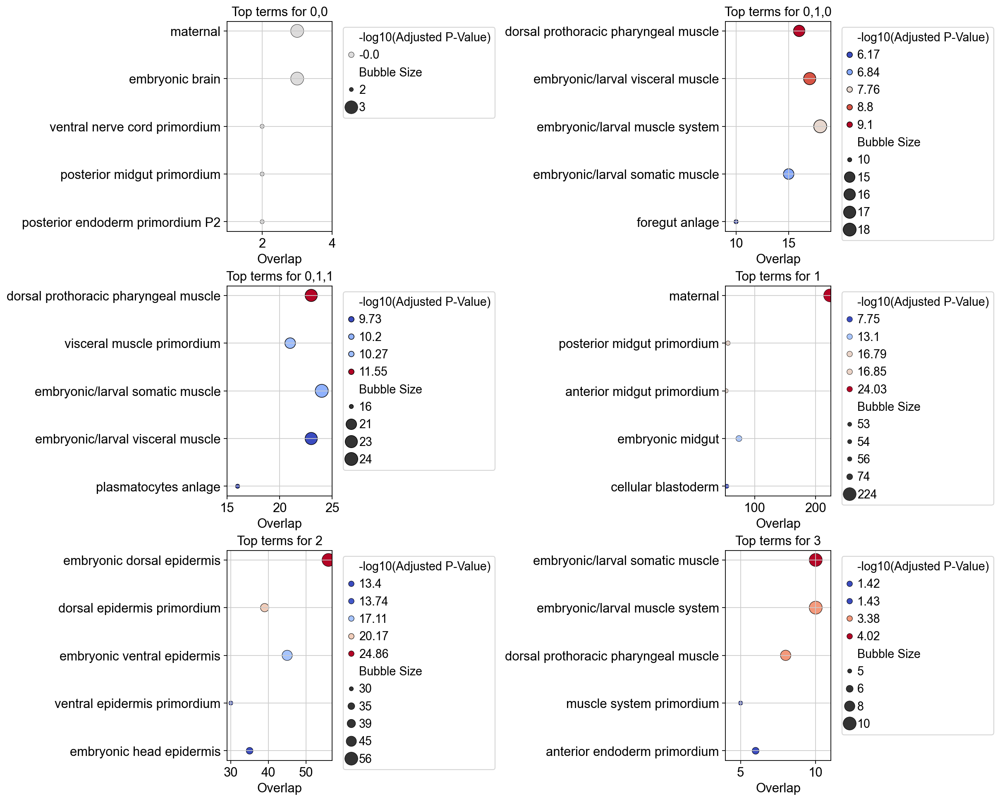

In [90]:
# inputs
query_genes_dict = de_gene_lists
background_genes = all_genes  # Background genes
ref_genes = reference_set  # Reference gene sets

# Define the directory for saving the output file
output_file = "../figures/chip6_annotation_dotplot.pdf"

# Prepare a 2-column grid for subplots
num_clusters = len(query_genes_dict)
rows = (num_clusters + 1) // 2  # Calculate rows based on the number of clusters
fig, axes = plt.subplots(rows, 2, figsize=(15, 4 * rows), constrained_layout=True)  # Wider x-axis (15, 4)

# Flatten axes for easier iteration (works even if there's a single row)
axes = axes.flatten()

for i, (cluster_name, query_genes) in enumerate(query_genes_dict.items()):
    # Run ORA
    results = hypergeometric_test(query_genes, ref_genes, background_genes)

    # Sort and select top results
    results_sorted = results.sort_values(by=['Adjusted P-Value', 'Overlap'], ascending=[True, False])[0:5]

    # Calculate -log10(Adjusted P-Value) for significance
    results_sorted["-log10(Adjusted P-Value)"] = -np.log10(results_sorted["Adjusted P-Value"]).round(2)

    # Prepare sizes for bubbles
    results_sorted["Bubble Size"] = results_sorted["Overlap"]  # Bubble size based on overlap

    # Plot bubble heatmap on the corresponding subplot
    ax = axes[i]
    sns.scatterplot(
        data=results_sorted,
        x="Overlap",
        y="Tissue",
        size="Bubble Size",
        hue="-log10(Adjusted P-Value)",
        palette="coolwarm",
        sizes=(20, 200),  # Control bubble size range
        edgecolor="black",
        ax=ax  # Add plot to the specific subplot
    )

    # Dynamically adjust x-axis limits to fit all dots
    x_min = results_sorted["Overlap"].min() - 1  # Add some padding on the left
    x_max = results_sorted["Overlap"].max() + 1  # Add some padding on the right
    ax.set_xlim(x_min, x_max)

    # Customize the subplot
    ax.set_title(f"Top terms for {cluster_name}")
    ax.set_xlabel("Overlap")
    ax.set_ylabel("")
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Remove unused axes if the number of clusters is odd
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Save all plots to a single file
plt.savefig(output_file, dpi=300)
print(f"All plots saved to {output_file}")

# Show the final figure (optional)
plt.show()

In [ ]:
sc.pl.umap(chip6, color = ['mesh','DNaseII','pros','grh', 'Mhc','elav', 'nw', 'Mef2'], use_raw=True, vmax= 'p99',vmin=0,
           cmap= 'Reds',
          frameon=False)

In [ ]:
chip6_celltype = {'0,0':'low_quality', '0,1,0':'muscle', '0,1,1':'muscle', '1':'midgut', '2':'epidermis', '3':'ctrl'}

In [ ]:
chip6.obs['celltype'] = chip6.obs['leiden_0.2_sub_sub'].replace(chip6_celltype)

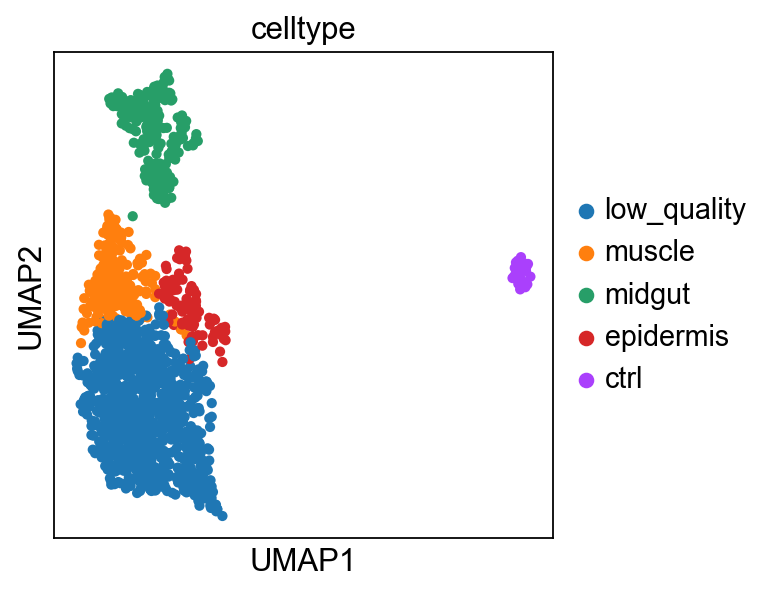

In [94]:
sc.pl.umap(chip6, color='celltype')

In [95]:
# Define function to get the top genes per cluster and return a dictionary
def get_top_genes_per_cluster(df, top_n=100):
    # Group by the 'Comparison' column and keep top genes for each cluster separately
    clusters = df['Comparison'].unique()
    top_genes_per_cluster = {
        cluster: df[df['Comparison'] == cluster]
        .sort_values(by=['Adj P-value', 'Log fold change'], ascending=[True, False])
        .head(top_n)['Gene']
        .tolist()
        for cluster in clusters
    }
    return top_genes_per_cluster

# Get the top 100 genes per cluster as a dictionary
top_genes_dict = get_top_genes_per_cluster(wilcoxon_results_df6, top_n=100)

# Print genes separately for each cluster
for cluster, genes in top_genes_dict.items():
    print(f"Top genes for {cluster}: {', '.join(genes)}")

Top genes for 0,0: mt:srRNA, mt:lrRNA, RpS2, RpS27A, pre-rRNA:CR45845, RpL40, EloB, mt:ND4, RpS5a, mt:CoI, RpLP0, gus, RpS18, loj, AP-2mu, SmD2, RpL11, AP-2sigma, dsd, alphaTub84D, Dim1, Dd, LysRS, slmb, Mob4, Pp4-19C, CG40191, CG31523, Top2, aPKC, CG9992, U2af38, par-6, Abi, Hem, Hmgs, Cam, Csp, CG8306, AdSL, Clamp, Ufm1, CG7222, RpS26, Cont, dco, krz, Hsf, Pmp70, Tnpo, CG17486, atl, Hlc, RN-tre, CG10166, AP-1-2beta, Baldspot, Rb97D, wech, PDZ-GEF, CG8243, Atg1, Ufd4, Smox, retm, pelo, His4r, CG8005, pho, Zw, AP-2alpha, CG7600, CG6700, mt:ATPase6, Sep1, rept, sxc, CG1513, d4, Nup154, Ssdp, CG4455, Zif, CG5447, Aef1, ttv, AlaRS, Mtpalpha, dap, tara, Sirup, CG11537, ND-23, CG17904, TM9SF3, CycD, CG3756, Gapdh2, Cdk2, Patr-1
Top genes for 0,1,0: Tret1-1, Col4a1, mt:srRNA, NimC4, mt:lrRNA, Dlg5, HLH54F, Ntl, kirre, CG14207, gus, Chd64, CG8036, sn, Argk, CG9650, mt:CoIII, Sap-r, CG6310, Ppn, scf, betaTub60D, CG31300, CG31431, PPO2, Neurochondrin, CG5080, CG9184, CG10591, drm, Plod, Indy, w

In [96]:
import pandas as pd
import re

# Step 1: Read the FlyBase terms text file and organize data into a DataFrame
def read_flybase_file(filepath):
    """Reads and processes FlyBase file into a DataFrame with relevant gene terms."""
    all_data = []
    with open(filepath, 'r') as f:
        for line in f:
            # Clean up and split the line by the '<newline>' marker first if it exists
            entries = line.strip().split('<newline>')

            # Initialize a list to hold the data for each row
            row_data = []
            row_name = None

            # Loop through each entry in the line
            for entry in entries:
                # Split the entry by the pipe character and strip leading/trailing whitespace
                row = entry.strip().split('|')

                # Only process if the row has enough columns
                if len(row) > 5:  # Adjust this condition based on your file structure
                    # Extract the first string as the row name (index) if not already set
                    if row_name is None:
                        row_name = row[0].strip()  # Set the row name (index) using the first column

                    # Use regex to extract "embryonic stage X" and the subsequent cell type
                    match = re.search(r'(embryonic stage \d+)\s*\|.*?\|\s*\d+\s*\|\s*([a-zA-Z\s]+)', entry)
                    if match:
                        stage = match.group(1).strip()  # Extract the "embryonic stage"
                        cell_type = match.group(2).strip()  # Extract the cell type description
                        row_data.append(f"{stage} {cell_type}")

            # Add the row's data to the overall list, if it has a valid row name
            if row_name and row_data:
                all_data.append([row_name] + row_data)

    # Determine the maximum number of columns across all rows
    max_columns = max(len(row) for row in all_data)

    # Pad rows with fewer elements to match the maximum number of columns
    for row in all_data:
        while len(row) < max_columns:
            row.append('')  # Use an empty string or None to pad

    # Create a DataFrame with multiple rows
    columns = ['Row Name'] + [f'Column {i}' for i in range(1, max_columns)]  # Dynamically create column names
    return pd.DataFrame(all_data, columns=columns)

# Step 2: Read and process FlyBase terms data
df = read_flybase_file('/Users/grosshanslab/Downloads/FlyBase_Fields_download (20).txt')
df['Row Name'] = df['Row Name'].str.split('\t').str[0]

# Step 3: Define a function to filter cells within each row based on embryonic stage >= 9
def filter_cells_by_stage(df, min_stage=9):
    """Filters cells in each row based on the given minimum embryonic stage."""
    def filter_row(row):
        # Loop through each cell in the row (excluding the "Row Name" column)
        filtered_row = []
        for cell in row:
            if isinstance(cell, str):  # Ensure the cell is a string to apply regex
                # Check if the cell contains "embryonic stage X" where X is a number
                match = re.search(r'embryonic stage (\d+)', cell)
                if match:
                    stage_number = int(match.group(1))
                    if stage_number >= min_stage:
                        filtered_row.append(cell)  # Keep the cell if stage number is >= min_stage
                    else:
                        filtered_row.append('')  # Replace with empty string if not meeting condition
                else:
                    filtered_row.append(cell)  # If no "embryonic stage X" pattern, keep as is
            else:
                filtered_row.append(cell)  # If not a string, keep as is (e.g., empty or NaN)
        return filtered_row

    # Apply the filter function to each row
    return pd.DataFrame(df.apply(filter_row, axis=1).tolist(), columns=df.columns)

# Step 4: Filter the DataFrame based on embryonic stage >= 9
filtered_df = filter_cells_by_stage(df, min_stage=9)

# Step 5: Create a filtered dictionary from the cleaned DataFrame
def create_filtered_dict_from_cleaned_df(df):
    """Creates a filtered dictionary from the cleaned DataFrame."""
    filtered_dict = {}
    for _, row in df.iterrows():
        row_name = row['Row Name']  # Extract the row name
        filtered_values = [cell for cell in row[1:] if isinstance(cell, str) and cell]  # Keep non-empty strings
        filtered_dict[row_name] = list(set(filtered_values))  # Remove duplicates
    return filtered_dict

# Create the filtered dictionary from the cleaned DataFrame
unique_filtered_dict = create_filtered_dict_from_cleaned_df(filtered_df)

# Step 6: Create a filtered dictionary of FlyBase terms per cluster
def create_filtered_dict_per_cluster(df, top_genes_dict):
    """Creates a filtered dictionary of FlyBase terms per cluster."""
    cluster_terms_dict = {}
    for cluster, genes in top_genes_dict.items():
        filtered_dict = {}
        for gene in genes:
            filtered_values = [
                cell for cell in df[df['Row Name'] == gene].iloc[:, 1:].values.flatten()
                if isinstance(cell, str) and re.search(r'embryonic stage (\d+)', cell)
            ]
            if filtered_values:
                filtered_dict[gene] = list(set(filtered_values))  # Remove duplicates
        cluster_terms_dict[cluster] = filtered_dict
    return cluster_terms_dict

# Generate the final filtered dictionary with FlyBase terms per cluster
final_filtered_dict_per_cluster = create_filtered_dict_per_cluster(filtered_df, top_genes_dict)

# Print the filtered dictionary for inspection (or use it as needed)
#for cluster, terms_dict in final_filtered_dict_per_cluster.items():
    #print(f"FlyBase terms for {cluster}:")
    #for gene, terms in terms_dict.items():
        #print(f"  {gene}: {', '.join(terms)}")

# Step 7: Count the unique terms for each cluster and sort them in descending order
def count_unique_terms_per_cluster(cluster_terms_dict):
    """Counts and sorts the frequency of unique terms for each cluster in descending order."""
    cluster_term_counts = {}
    for cluster, gene_terms in cluster_terms_dict.items():
        # Flatten the list of terms for all genes in the cluster
        all_terms = [term for terms_list in gene_terms.values() for term in terms_list]
        # Count the frequency of each unique term using Counter
        term_counts = Counter(all_terms)
        # Store the sorted term counts in descending order of frequency
        cluster_term_counts[cluster] = term_counts.most_common()
    return cluster_term_counts

# Get the term counts per cluster and sort them in descending order
term_counts_per_cluster = count_unique_terms_per_cluster(final_filtered_dict_per_cluster)

# Print the unique term counts for each cluster in descending order
for cluster, term_counts in term_counts_per_cluster.items():
    print(f"Unique terms count for {cluster}:")
    for term, count in term_counts:
        print(f"  {term}: {count}")

FileNotFoundError: [Errno 2] No such file or directory: '/Users/grosshanslab/Downloads/FlyBase_Fields_download (20).txt'

In [ ]:
import matplotlib.pyplot as plt

# Function to plot pie charts for term counts in each cluster
def plot_pie_charts(term_counts_per_cluster, min_count=11):
    """Creates pie charts for term counts in each cluster, ignoring terms with counts <= min_count."""
    for cluster, term_counts in term_counts_per_cluster.items():
        # Filter terms and counts based on the minimum count
        filtered_term_counts = [(term, count) for term, count in term_counts if count >= min_count]
        if not filtered_term_counts:  # Skip clusters with no terms meeting the criteria
            print(f"No terms with counts > {min_count - 1} for {cluster}. Skipping pie chart.")
            continue

        # Extract terms and counts from the filtered list of tuples
        terms = [term for term, count in filtered_term_counts]
        counts = [count for term, count in filtered_term_counts]

        # Plot the pie chart
        plt.figure(figsize=(8, 8))
        plt.pie(
            counts,
            labels=terms,
            autopct='%1.1f%%',  # Show percentage
            startangle=140,  # Start angle for better layout
        )
        plt.title(f"Term Distribution for {cluster}")
        plt.axis('equal')  # Equal aspect ratio for a perfect circle
        plt.show()

# Plot pie charts for each cluster, ignoring terms with counts <= 5
plot_pie_charts(term_counts_per_cluster, min_count=11)


In [ ]:
import matplotlib.pyplot as plt

# Function to plot bar charts for term counts in each cluster
def plot_bar_charts(term_counts_per_cluster, min_count=11):
    """Creates bar charts for term counts in each cluster, ignoring terms with counts <= min_count."""
    for cluster, term_counts in term_counts_per_cluster.items():
        # Filter terms and counts based on the minimum count
        filtered_term_counts = [(term, count) for term, count in term_counts if count >= min_count]
        if not filtered_term_counts:  # Skip clusters with no terms meeting the criteria
            print(f"No terms with counts > {min_count - 1} for {cluster}. Skipping bar chart.")
            continue

        # Extract terms and counts from the filtered list of tuples
        terms = [term for term, count in filtered_term_counts]
        counts = [count for term, count in filtered_term_counts]

        # Plot the bar chart
        plt.figure(figsize=(10, 6))
        plt.barh(terms, counts, color='skyblue')
        plt.xlabel("Counts")
        plt.ylabel("Terms")
        plt.title(f"Term Distribution for {cluster}")
        plt.gca().invert_yaxis()  # Invert y-axis to have the highest count at the top
        plt.tight_layout()
        plt.show()

# Plot bar charts for each cluster, ignoring terms with counts <= 5
plot_bar_charts(term_counts_per_cluster, min_count=11)


In [ ]:
# Function to plot bar charts for top-N terms in each cluster
def plot_top_n_terms(term_counts_per_cluster, top_n=10):
    """Creates bar charts showing the top-N most frequent terms for each cluster."""
    for cluster, term_counts in term_counts_per_cluster.items():
        # Keep only the top-N terms
        top_terms_counts = term_counts[:top_n]
        if not top_terms_counts:  # Skip clusters with no terms
            print(f"No terms to display for {cluster}. Skipping bar chart.")
            continue

        # Extract terms and counts from the top-N list of tuples
        terms = [term for term, count in top_terms_counts]
        counts = [count for term, count in top_terms_counts]

        # Plot the bar chart
        plt.figure(figsize=(10, 6))
        plt.barh(terms, counts, color='skyblue')
        plt.xlabel("Counts")
        plt.ylabel("Terms")
        plt.title(f"Top {top_n} Term Distribution for {cluster}")
        plt.gca().invert_yaxis()  # Invert y-axis to have the highest count at the top
        plt.tight_layout()
        plt.show()

# Plot bar charts for the top 10 terms in each cluster
plot_top_n_terms(term_counts_per_cluster, top_n=10)

In [ ]:
# Function to plot bar charts for top-N terms in each cluster, excluding a list of clusters
def plot_top_n_terms_exclude_list(term_counts_per_cluster, top_n=6, exclude_clusters=[], save_path=None):
    """
    Creates bar charts showing the top-N most frequent terms for each cluster,
    excluding specified clusters. Saves the charts if save_path is provided.
    """
    for cluster, term_counts in term_counts_per_cluster.items():
        # Skip the clusters in the exclude list
        if cluster in exclude_clusters:
            print(f"Skipping {cluster}.")
            continue

        # Keep only the top-N terms
        top_terms_counts = term_counts[:top_n]
        if not top_terms_counts:  # Skip clusters with no terms
            print(f"No terms to display for {cluster}. Skipping bar chart.")
            continue

        # Extract terms and counts from the top-N list of tuples
        terms = [term for term, count in top_terms_counts]
        counts = [count for term, count in top_terms_counts]

        # Plot the bar chart
        plt.figure(figsize=(8, 3))
        plt.barh(terms, counts, color='skyblue')
        plt.xlabel("Counts")
        plt.ylabel("Terms")
        plt.title(f"Top {top_n} Term Distribution for {cluster}")
        plt.gca().invert_yaxis()  # Invert y-axis to have the highest count at the top
        plt.tight_layout()

        # Save the plot as an image if save_path is provided
        if save_path:
            filename = f"{save_path}/{cluster.replace(' ', '_')}_top_{top_n}_terms.png"
            plt.savefig(filename, dpi=300, bbox_inches='tight')
            print(f"Saved plot for {cluster} to {filename}")

        plt.show()

# Example: Plot bar charts for top 10 terms in each cluster, excluding a list of clusters
exclude_clusters_list = ['0,0', '2']  # Replace with the names of the clusters to exclude
output_path = "Integration_comparison/images/"  # Replace with the desired directory to save images
plot_top_n_terms_exclude_list(term_counts_per_cluster, top_n=6, exclude_clusters=exclude_clusters_list, save_path=output_path)



In [ ]:
# Example function to prepare data for the heatmap
def prepare_heatmap_data(term_counts_per_cluster, top_n=10, normalize_per_row=False, exclude_clusters=[], exclude_terms=[]):
    """Prepare data for heatmap visualization, with optional row normalization, cluster exclusion, and term exclusion."""
    # Collect the top terms and their counts for all clusters
    rows, columns, data = [], [], []
    for cluster, term_counts in term_counts_per_cluster.items():
        if cluster in exclude_clusters:  # Skip excluded clusters
            continue
        top_terms = term_counts[:top_n]
        for term, count in top_terms:
            if term in exclude_terms:  # Skip excluded terms
                continue
            rows.append(cluster)
            columns.append(term)
            data.append(count)

    # Create a DataFrame with clusters as rows and terms as columns
    df = pd.DataFrame({'Cluster': rows, 'Term': columns, 'Count': data})
    heatmap_df = df.pivot(index='Cluster', columns='Term', values='Count').fillna(0)

    # Normalize rows and convert to percentages (if required)
    if normalize_per_row:
        heatmap_df = heatmap_df.div(heatmap_df.sum(axis=1), axis=0) * 100  # Convert to percentages

    return heatmap_df

# Example: Specify clusters and terms to exclude
exclude_clusters_list = ["0,0", "2"]  # Replace with actual cluster names
exclude_terms_list = ["embryonic stage 11 organism", "embryonic stage 13 embryonic", "embryonic stage 13 organism", "embryonic stage 9 organism"]  # Replace with terms you want to exclude

# Prepare data
heatmap_data = prepare_heatmap_data(
    term_counts_per_cluster, 
    top_n=6, 
    normalize_per_row=True, 
    exclude_clusters=exclude_clusters_list, 
    exclude_terms=exclude_terms_list
)

# Plot heatmap
plt.figure(figsize=(12, 9))
sns.heatmap(heatmap_data, annot=True, cmap='Blues', fmt='.1f', cbar_kws={'label': 'Percentage (%)'})
plt.title("Normalized Top Terms per Cluster (Filtered Terms)")
plt.xlabel("Terms")
plt.ylabel("Clusters")
plt.tight_layout()
plt.show()

### Chip7 annotation

In [ ]:
sc.pl.umap(chip7, color='leiden_0.1')

In [ ]:
sc.tl.leiden(chip7, restrict_to=['leiden_0.1',['2']], resolution=0.2, key_added='leiden_0.1_sub')

In [ ]:
sc.pl.umap(chip7, color='leiden_0.1_sub')

In [ ]:
chip7_hvg = chip7.copy()

In [ ]:
sc.pp.highly_variable_genes(chip7_hvg, n_top_genes=4000)

In [ ]:
chip7_hvg = chip7_hvg[:, chip7_hvg.var['highly_variable']]
chip7_hvg

In [ ]:
sc.tl.rank_genes_groups(chip7_hvg, groupby='leiden_0.1_sub', method='wilcoxon', use_raw=False)

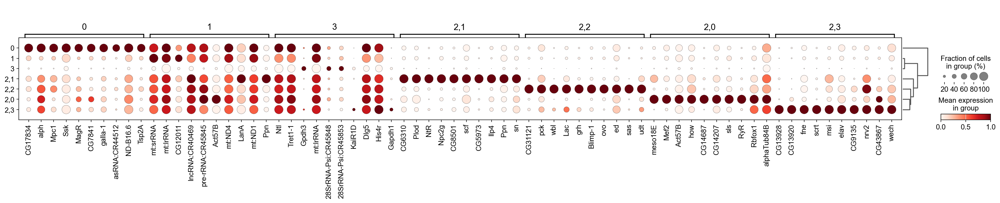

In [104]:
sc.pl.rank_genes_groups_dotplot(chip7_hvg, standard_scale='var', n_genes=10)

In [ ]:
# Extract and process gene information from wilcoxon results
wilcoxon_results7 = chip7_hvg.uns['rank_genes_groups']
comparison_names = wilcoxon_results7['names'].dtype.names  # Get the names of comparisons

# Initialize empty lists to collect the flattened data
gene_list, comparison_list, score_list, pval_adj_list, logfc_list = [], [], [], [], []

# Loop through each comparison and collect the values
for comp in comparison_names:
    # Extend the lists with data corresponding to each comparison
    gene_list.extend(wilcoxon_results7['names'][comp])
    comparison_list.extend([comp] * len(wilcoxon_results7['names'][comp]))  # Repeat comparison name
    score_list.extend(wilcoxon_results7['scores'][comp])
    pval_adj_list.extend(wilcoxon_results7['pvals_adj'][comp])
    logfc_list.extend(wilcoxon_results7['logfoldchanges'][comp])

# Create a dictionary for the DataFrame
result_dict7 = {
    'Gene': gene_list,
    'Comparison': comparison_list,
    'Score': score_list,
    'Adj P-value': pval_adj_list,
    'Log fold change': logfc_list
}

# Create the DataFrame
wilcoxon_results_df7 = pd.DataFrame(result_dict7)

In [ ]:
# in situ hyb dataset with removed NaN values for Gene and "no staining" values for annotation

#filter out genes that are not among HVGs in my dataset
data_sub = data[data['Gene'].isin(list(chip7_hvg.var_names))]

# Create the reference gene set
reference_set = data_sub.groupby("Annotation")["Gene"].apply(list).to_dict()

# Display the reference set
for annotation, genes in reference_set.items():
    print(f"{annotation}: {genes}")

In [ ]:
# Filter the data based on conditions
filtered_data = wilcoxon_results_df7[(wilcoxon_results_df7["Log fold change"] > 0) & (wilcoxon_results_df7["Adj P-value"] < 0.05)]

# Group by "Comparison" to create separate DataFrames
comparison_dfs = {comp: df for comp, df in filtered_data.groupby("Comparison")}
de_gene_lists = {comp: df["Gene"].tolist() for comp, df in filtered_data.groupby("Comparison")}

# Display the filtered dataframes (optional)
for comparison, df in comparison_dfs.items():
    print(f"Comparison: {comparison}, Number of Genes: {len(df)}")
    print(df.head())

In [ ]:
all_genes = chip7_hvg.var_names.to_list()

All plots saved to ../figures/chip7_annotation_dotplot.pdf


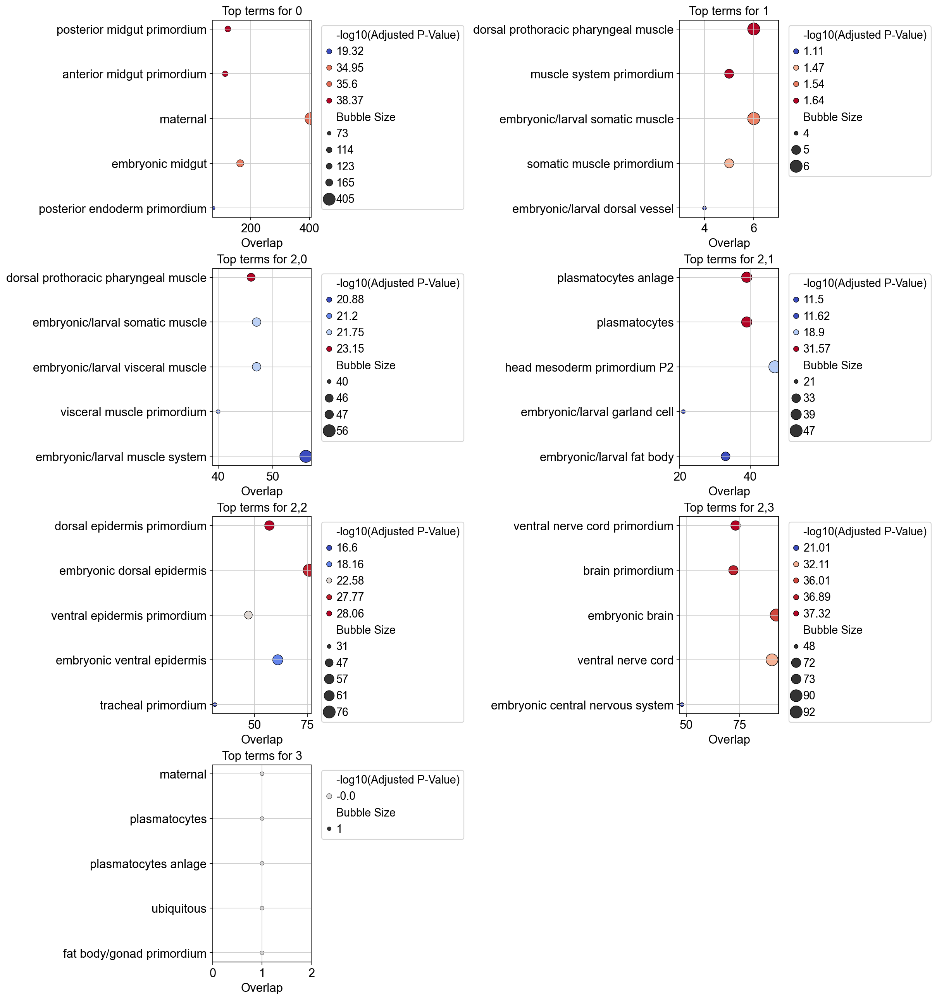

In [109]:
# inputs
query_genes_dict = de_gene_lists
background_genes = all_genes  # Background genes
ref_genes = reference_set  # Reference gene sets

# Define the directory for saving the output file
output_file = "../figures/chip7_annotation_dotplot.pdf"

# Prepare a 2-column grid for subplots
num_clusters = len(query_genes_dict)
rows = (num_clusters + 1) // 2  # Calculate rows based on the number of clusters
fig, axes = plt.subplots(rows, 2, figsize=(15, 4 * rows), constrained_layout=True)  # Wider x-axis (15, 4)

# Flatten axes for easier iteration (works even if there's a single row)
axes = axes.flatten()

for i, (cluster_name, query_genes) in enumerate(query_genes_dict.items()):
    # Run ORA
    results = hypergeometric_test(query_genes, ref_genes, background_genes)

    # Sort and select top results
    results_sorted = results.sort_values(by=['Adjusted P-Value', 'Overlap'], ascending=[True, False])[0:5]

    # Calculate -log10(Adjusted P-Value) for significance
    results_sorted["-log10(Adjusted P-Value)"] = -np.log10(results_sorted["Adjusted P-Value"]).round(2)

    # Prepare sizes for bubbles
    results_sorted["Bubble Size"] = results_sorted["Overlap"]  # Bubble size based on overlap

    # Plot bubble heatmap on the corresponding subplot
    ax = axes[i]
    sns.scatterplot(
        data=results_sorted,
        x="Overlap",
        y="Tissue",
        size="Bubble Size",
        hue="-log10(Adjusted P-Value)",
        palette="coolwarm",
        sizes=(20, 200),  # Control bubble size range
        edgecolor="black",
        ax=ax  # Add plot to the specific subplot
    )

    # Dynamically adjust x-axis limits to fit all dots
    x_min = results_sorted["Overlap"].min() - 1  # Add some padding on the left
    x_max = results_sorted["Overlap"].max() + 1  # Add some padding on the right
    ax.set_xlim(x_min, x_max)

    # Customize the subplot
    ax.set_title(f"Top terms for {cluster_name}")
    ax.set_xlabel("Overlap")
    ax.set_ylabel("")
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Remove unused axes if the number of clusters is odd
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Save all plots to a single file
plt.savefig(output_file, dpi=300)
print(f"All plots saved to {output_file}")

# Show the final figure (optional)
plt.show()

In [ ]:
chip7_celltype = {'0':'midgut', '1':'low_quality', '2,0':'muscle', '2,1':'plasmatocyte', '2,2':'epidermis', '2,3':'neuron', '3':'ctrl'}

In [ ]:
chip7.obs['celltype'] = chip7.obs['leiden_0.1_sub'].map(chip7_celltype)

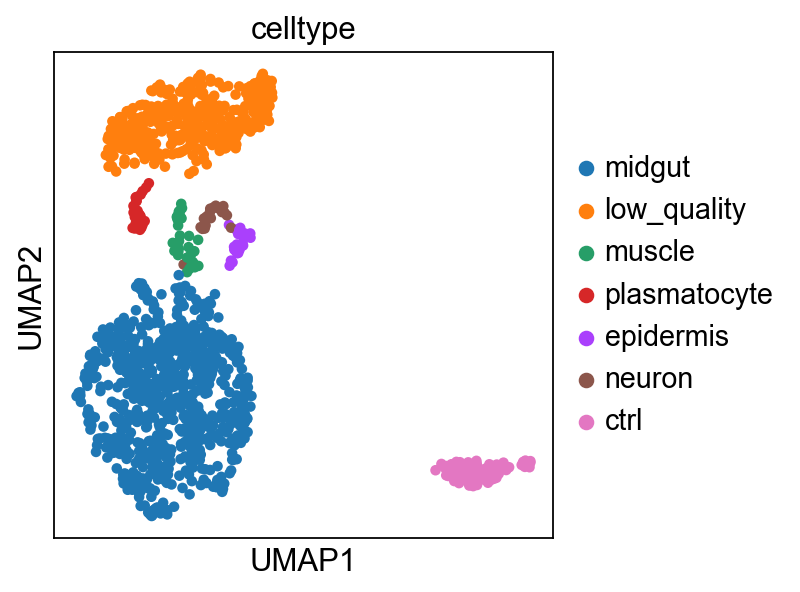

In [112]:
sc.pl.umap(chip7, color='celltype')

### Chip8 annotation

In [ ]:
chip8

In [ ]:
sc.pl.umap(chip8, color=['leiden_0.1', 'leiden_0.2'])

In [ ]:
sc.tl.leiden(chip8, resolution=0.1, restrict_to=['leiden_0.2',['3']], key_added='leiden_0.2_sub')

In [ ]:
sc.pl.umap(chip8, color='leiden_0.2_sub')

In [ ]:
sc.tl.leiden(chip8, resolution=0.1, restrict_to=['leiden_0.2_sub',['3,1']], key_added='leiden_0.2_sub_sub')

In [ ]:
sc.pl.umap(chip8, color='leiden_0.2_sub_sub')

In [ ]:
sc.tl.leiden(chip8, restrict_to=['leiden_0.2_sub_sub', ['3,0']], resolution=0.1, key_added='leiden_0.2_sub_3x')

In [ ]:
sc.pl.umap(chip8, color='leiden_0.2_sub_3x')

In [ ]:
chip8_hvg = chip8.copy()

In [ ]:
sc.pp.highly_variable_genes(chip8_hvg, n_top_genes=4000)

In [ ]:
chip8_hvg = chip8_hvg[:, chip8_hvg.var['highly_variable']]
chip8_hvg

In [ ]:
sc.tl.rank_genes_groups(chip8_hvg, groupby='leiden_0.2_sub_3x', method='wilcoxon', use_raw=False)

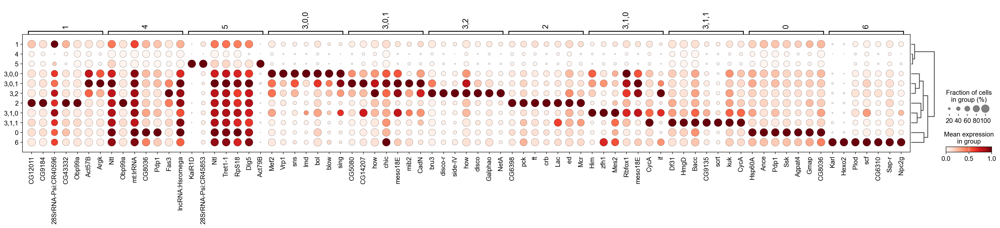

In [125]:
sc.pl.rank_genes_groups_dotplot(chip8_hvg, standard_scale='var', n_genes=7)

In [ ]:
# Extract and process gene information from wilcoxon results
wilcoxon_results8 = chip8_hvg.uns['rank_genes_groups']
comparison_names = wilcoxon_results8['names'].dtype.names  # Get the names of comparisons

# Initialize empty lists to collect the flattened data
gene_list, comparison_list, score_list, pval_adj_list, logfc_list = [], [], [], [], []

# Loop through each comparison and collect the values
for comp in comparison_names:
    # Extend the lists with data corresponding to each comparison
    gene_list.extend(wilcoxon_results8['names'][comp])
    comparison_list.extend([comp] * len(wilcoxon_results8['names'][comp]))  # Repeat comparison name
    score_list.extend(wilcoxon_results8['scores'][comp])
    pval_adj_list.extend(wilcoxon_results8['pvals_adj'][comp])
    logfc_list.extend(wilcoxon_results8['logfoldchanges'][comp])

# Create a dictionary for the DataFrame
result_dict8 = {
    'Gene': gene_list,
    'Comparison': comparison_list,
    'Score': score_list,
    'Adj P-value': pval_adj_list,
    'Log fold change': logfc_list
}

# Create the DataFrame
wilcoxon_results_df8 = pd.DataFrame(result_dict8)

In [ ]:
#filter out genes that are not among HVGs in my dataset
data_sub = data[data['Gene'].isin(list(chip8_hvg.var_names))]

# Create the reference gene set
reference_set = data_sub.groupby("Annotation")["Gene"].apply(list).to_dict()

# Display the reference set
for annotation, genes in reference_set.items():
    print(f"{annotation}: {genes}")

In [ ]:
# Filter the data based on conditions
filtered_data = wilcoxon_results_df8[(wilcoxon_results_df8["Log fold change"] > 0) & (wilcoxon_results_df8["Adj P-value"] < 0.05)]

# Group by "Comparison" to create separate DataFrames
comparison_dfs = {comp: df for comp, df in filtered_data.groupby("Comparison")}
de_gene_lists = {comp: df["Gene"].tolist() for comp, df in filtered_data.groupby("Comparison")}

# Display the filtered dataframes (optional)
for comparison, df in comparison_dfs.items():
    print(f"Comparison: {comparison}, Number of Genes: {len(df)}")
    print(df.head())

In [ ]:
all_genes = chip8_hvg.var_names.to_list()

All plots saved to ../figures/chip8_annotation_dotplot.pdf


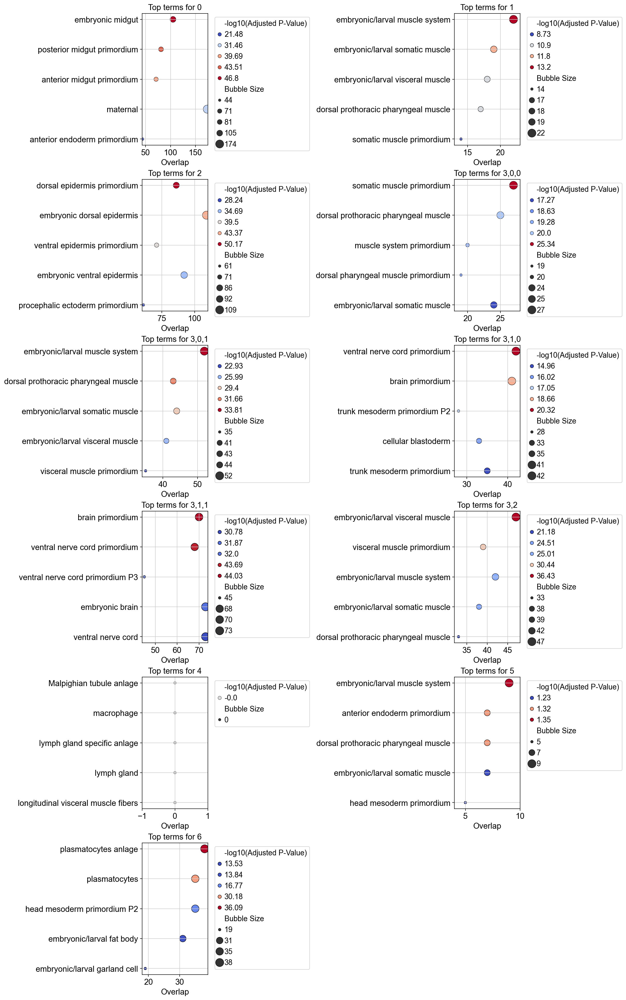

In [130]:
# inputs
query_genes_dict = de_gene_lists
background_genes = all_genes  # Background genes
ref_genes = reference_set  # Reference gene sets

# Define the directory for saving the output file
output_file = "../figures/chip8_annotation_dotplot.pdf"

# Prepare a 2-column grid for subplots
num_clusters = len(query_genes_dict)
rows = (num_clusters + 1) // 2  # Calculate rows based on the number of clusters
fig, axes = plt.subplots(rows, 2, figsize=(15, 4 * rows), constrained_layout=True)  # Wider x-axis (15, 4)

# Flatten axes for easier iteration (works even if there's a single row)
axes = axes.flatten()

for i, (cluster_name, query_genes) in enumerate(query_genes_dict.items()):
    # Run ORA
    results = hypergeometric_test(query_genes, ref_genes, background_genes)

    # Sort and select top results
    results_sorted = results.sort_values(by=['Adjusted P-Value', 'Overlap'], ascending=[True, False])[0:5]

    # Calculate -log10(Adjusted P-Value) for significance
    results_sorted["-log10(Adjusted P-Value)"] = -np.log10(results_sorted["Adjusted P-Value"]).round(2)

    # Prepare sizes for bubbles
    results_sorted["Bubble Size"] = results_sorted["Overlap"]  # Bubble size based on overlap

    # Plot bubble heatmap on the corresponding subplot
    ax = axes[i]
    sns.scatterplot(
        data=results_sorted,
        x="Overlap",
        y="Tissue",
        size="Bubble Size",
        hue="-log10(Adjusted P-Value)",
        palette="coolwarm",
        sizes=(20, 200),  # Control bubble size range
        edgecolor="black",
        ax=ax  # Add plot to the specific subplot
    )

    # Dynamically adjust x-axis limits to fit all dots
    x_min = results_sorted["Overlap"].min() - 1  # Add some padding on the left
    x_max = results_sorted["Overlap"].max() + 1  # Add some padding on the right
    ax.set_xlim(x_min, x_max)

    # Customize the subplot
    ax.set_title(f"Top terms for {cluster_name}")
    ax.set_xlabel("Overlap")
    ax.set_ylabel("")
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Remove unused axes if the number of clusters is odd
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Save all plots to a single file
plt.savefig(output_file, dpi=300)
print(f"All plots saved to {output_file}")

# Show the final figure (optional)
plt.show()


In [ ]:
chip8_celltype = {'0':'midgut', '1':'low_quality', '2':'epidermis', '3,0,0':'muscle', '3,0,1':'muscle', '3,1,0':'neuron', '3,1,1':'neuron', '3,2':'muscle', '6':'plasmatocyte', '4':'ctrl', '5':'ctrl'}

In [ ]:
chip8.obs['celltype'] = chip8.obs['leiden_0.2_sub_3x'].map(chip8_celltype)

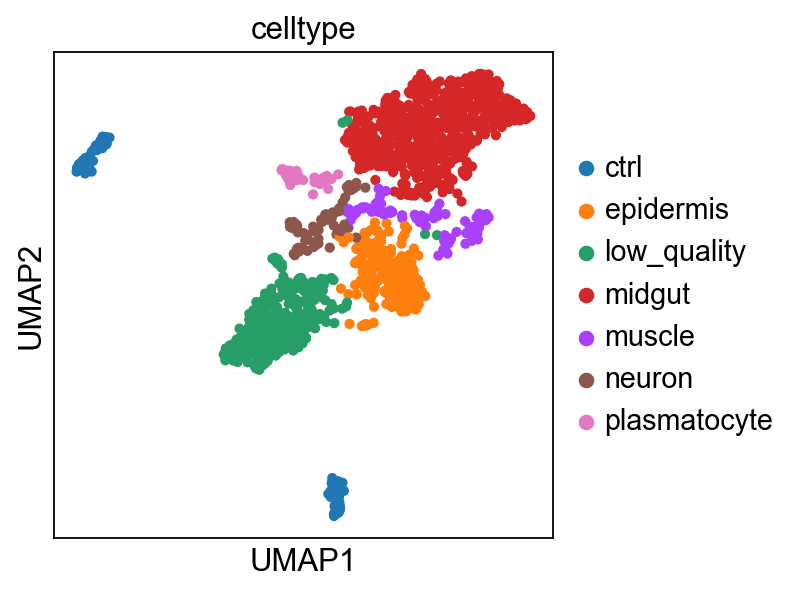

In [133]:
sc.pl.umap(chip8, color='celltype')

### Chip9 annotation

In [ ]:
sc.pl.umap(chip9, color='leiden_0.2')

In [ ]:
sc.tl.leiden(chip9, restrict_to=['leiden_0.2', ['3']], key_added='leiden_0.2_sub', resolution=0.1)

In [ ]:
sc.pl.umap(chip9, color='leiden_0.2_sub')

In [ ]:
sc.tl.leiden(chip9, restrict_to=['leiden_0.2_sub',['4']], resolution=0.1, key_added='leiden_0.2_sub_sub')

In [ ]:
sc.pl.umap(chip9, color='leiden_0.2_sub_sub')

In [ ]:
sc.tl.leiden(chip9, restrict_to=['leiden_0.2_sub_sub',['1']], resolution=0.2, key_added='leiden_0.2_sub_3x')

In [ ]:
sc.pl.umap(chip9, color='leiden_0.2_sub_3x')

In [ ]:
chip9_hvg = chip9.copy()

In [ ]:
sc.pp.highly_variable_genes(chip9_hvg, n_top_genes=4000)

In [ ]:
chip9_hvg = chip9_hvg[:, chip9_hvg.var['highly_variable']]
chip9_hvg

In [ ]:
sc.tl.rank_genes_groups(chip9_hvg, groupby='leiden_0.2_sub_3x', method='wilcoxon', use_raw=False)

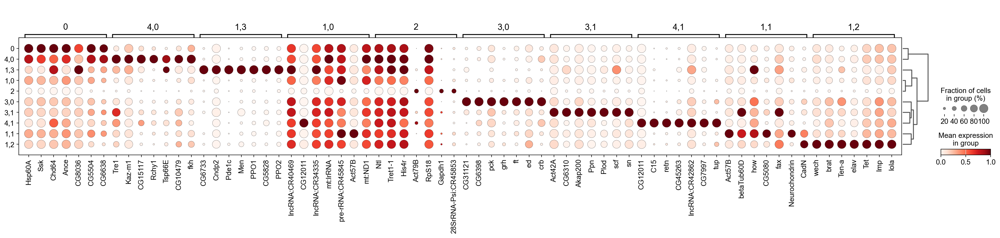

In [145]:
sc.pl.rank_genes_groups_dotplot(chip9_hvg, standard_scale='var', n_genes=7)

In [ ]:
# Extract and process gene information from wilcoxon results
wilcoxon_results9 = chip9_hvg.uns['rank_genes_groups']
comparison_names = wilcoxon_results9['names'].dtype.names  # Get the names of comparisons

# Initialize empty lists to collect the flattened data
gene_list, comparison_list, score_list, pval_adj_list, logfc_list = [], [], [], [], []

# Loop through each comparison and collect the values
for comp in comparison_names:
    # Extend the lists with data corresponding to each comparison
    gene_list.extend(wilcoxon_results9['names'][comp])
    comparison_list.extend([comp] * len(wilcoxon_results9['names'][comp]))  # Repeat comparison name
    score_list.extend(wilcoxon_results9['scores'][comp])
    pval_adj_list.extend(wilcoxon_results9['pvals_adj'][comp])
    logfc_list.extend(wilcoxon_results9['logfoldchanges'][comp])

# Create a dictionary for the DataFrame
result_dict9 = {
    'Gene': gene_list,
    'Comparison': comparison_list,
    'Score': score_list,
    'Adj P-value': pval_adj_list,
    'Log fold change': logfc_list
}

# Create the DataFrame
wilcoxon_results_df9 = pd.DataFrame(result_dict9)

In [ ]:
#filter out genes that are not among HVGs in my dataset
data_sub = data[data['Gene'].isin(list(chip9_hvg.var_names))]

# Create the reference gene set
reference_set = data_sub.groupby("Annotation")["Gene"].apply(list).to_dict()

# Display the reference set
for annotation, genes in reference_set.items():
    print(f"{annotation}: {genes}")

In [ ]:
# Filter the data based on conditions
filtered_data = wilcoxon_results_df9[(wilcoxon_results_df9["Log fold change"] > 0) & (wilcoxon_results_df9["Adj P-value"] < 0.05)]

# Group by "Comparison" to create separate DataFrames
comparison_dfs = {comp: df for comp, df in filtered_data.groupby("Comparison")}
de_gene_lists = {comp: df["Gene"].tolist() for comp, df in filtered_data.groupby("Comparison")}

# Display the filtered dataframes (optional)
for comparison, df in comparison_dfs.items():
    print(f"Comparison: {comparison}, Number of Genes: {len(df)}")
    print(df.head())

In [ ]:
de_gene_lists

In [ ]:
all_genes = chip9_hvg.var_names.to_list()

All plots saved to ../figures/chip9_annotation_dotplot.pdf


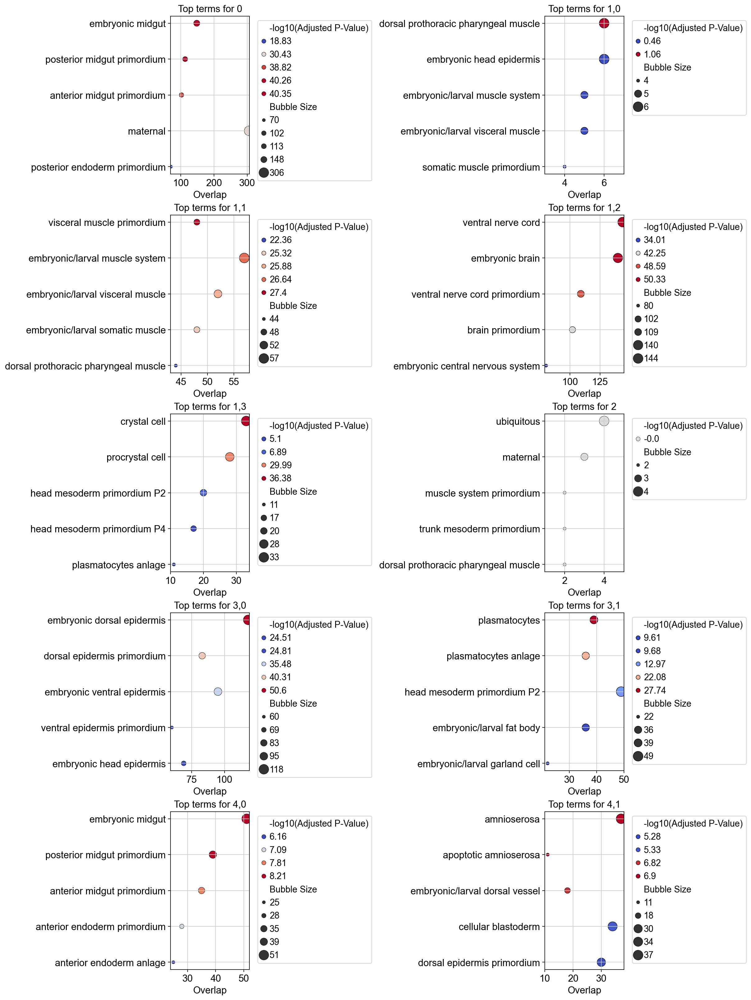

In [151]:
# inputs
query_genes_dict = de_gene_lists
background_genes = all_genes  # Background genes
ref_genes = reference_set  # Reference gene sets
# Define the directory for saving the output file
output_file = "../figures/chip9_annotation_dotplot.pdf"

# Prepare a 2-column grid for subplots
num_clusters = len(query_genes_dict)
rows = (num_clusters + 1) // 2  # Calculate rows based on the number of clusters
fig, axes = plt.subplots(rows, 2, figsize=(15, 4 * rows), constrained_layout=True)  # Wider x-axis (15, 4)

# Flatten axes for easier iteration (works even if there's a single row)
axes = axes.flatten()

for i, (cluster_name, query_genes) in enumerate(query_genes_dict.items()):
    # Run ORA
    results = hypergeometric_test(query_genes, ref_genes, background_genes)

    # Sort and select top results
    results_sorted = results.sort_values(by=['Adjusted P-Value', 'Overlap'], ascending=[True, False])[0:5]

    # Calculate -log10(Adjusted P-Value) for significance
    results_sorted["-log10(Adjusted P-Value)"] = -np.log10(results_sorted["Adjusted P-Value"]).round(2)

    # Prepare sizes for bubbles
    results_sorted["Bubble Size"] = results_sorted["Overlap"]  # Bubble size based on overlap

    # Plot bubble heatmap on the corresponding subplot
    ax = axes[i]
    sns.scatterplot(
        data=results_sorted,
        x="Overlap",
        y="Tissue",
        size="Bubble Size",
        hue="-log10(Adjusted P-Value)",
        palette="coolwarm",
        sizes=(20, 200),  # Control bubble size range
        edgecolor="black",
        ax=ax  # Add plot to the specific subplot
    )

    # Dynamically adjust x-axis limits to fit all dots
    x_min = results_sorted["Overlap"].min() - 1  # Add some padding on the left
    x_max = results_sorted["Overlap"].max() + 1  # Add some padding on the right
    ax.set_xlim(x_min, x_max)

    # Customize the subplot
    ax.set_title(f"Top terms for {cluster_name}")
    ax.set_xlabel("Overlap")
    ax.set_ylabel("")
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Remove unused axes if the number of clusters is odd
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Save all plots to a single file
plt.savefig(output_file, dpi=300)
print(f"All plots saved to {output_file}")

# Show the final figure (optional)
plt.show()


In [ ]:
chip9_celltype = {'0':'midgut', '1,0':'low_quality', '1,1':'muscle', '1,2':'neuron', '1,3':'low_quality', '3,0':'epidermis', 
                  '3,1':'plasmatocyte', '4,0':'midgut', '4,1':'amnioserosa', '2':'ctrl'}

In [ ]:
# Define well-annotated populations in 'sample'
#neg_pos_ctrl = ['Neg_Ctrl', 'Pos_Ctrl', 'NoCell_Ctrl']

# Create the 'celltype' column
#chip9.obs['celltype'] = chip9.obs.apply(
    #lambda row: row['sample'] if row['sample'] in neg_pos_ctrl else chip9_celltype.get(row['leiden_0.2_sub_4x'], 'Unknown'),
    #axis=1
#)

In [ ]:
chip9.obs['celltype'] = chip9.obs['leiden_0.2_sub_3x'].map(chip9_celltype)

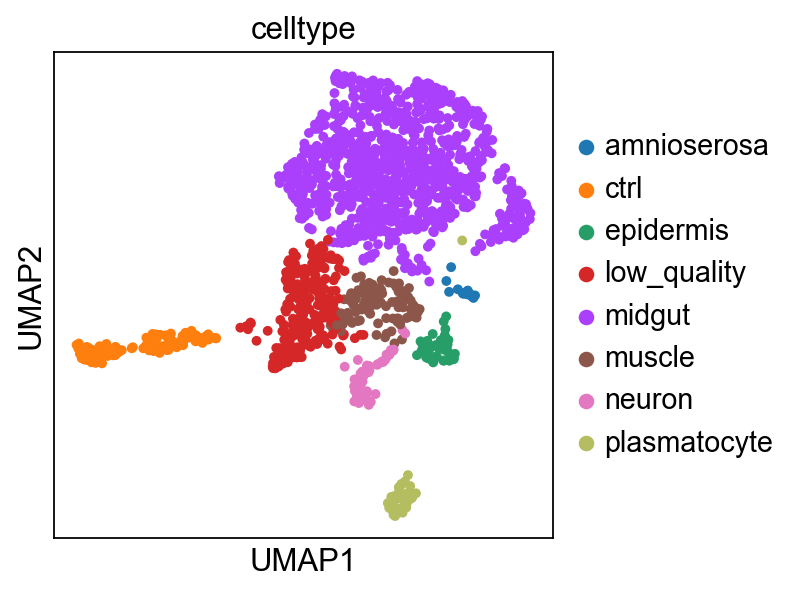

In [155]:
sc.pl.umap(chip9, color='celltype')

## Concat

In [ ]:
chip6_raw = chip6.raw.to_adata()
chip7_raw = chip7.raw.to_adata()
chip8_raw = chip8.raw.to_adata()
chip9_raw = chip9.raw.to_adata()

In [ ]:
adata=chip6_raw.concatenate(chip7_raw, chip8_raw, chip9_raw, batch_key='batch', batch_categories=['WT_01', 'WT_02', 'WT_03', 'WT_04'])
adata

In [ ]:
adata_con=adata.copy()

In [ ]:
adata_con.raw = adata_con.copy()

In [ ]:
sc.pp.normalize_total(adata_con)
sc.pp.log1p(adata_con)

In [ ]:
sc.pp.pca(adata_con)

In [ ]:
sc.pp.neighbors(adata_con, n_pcs=30)

In [ ]:
sc.tl.umap(adata_con)

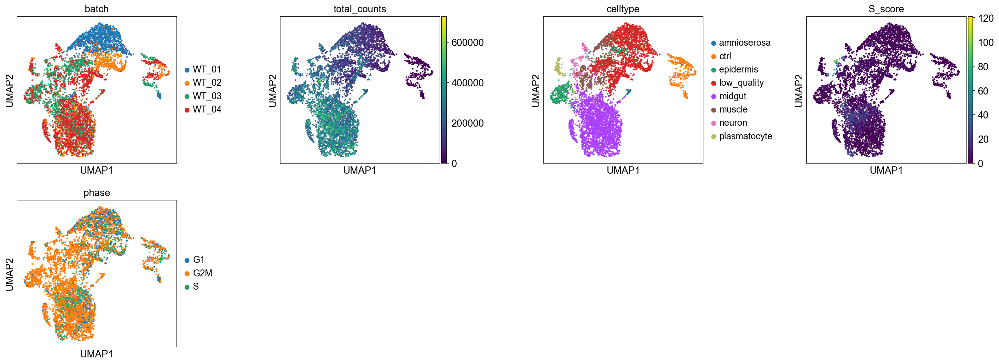

In [164]:
sc.pl.umap(adata_con, color=['batch', 'total_counts', 'celltype', 'S_score','phase'], wspace=0.5, vmin=0)

In [ ]:
sc.pl.umap(adata_con, color=['fkh', 'mesh', 'Mef2', 'grh', 'elav', 'Tre1', 'zfh1', 'pros', 'GATAe', 'Him', 'srp'], cmap='Reds', vmax='p99')

In [ ]:
sc.tl.leiden(adata_con, resolution=0.1, key_added='leiden_0.1')
sc.tl.leiden(adata_con, resolution=0.2, key_added='leiden_0.2')
sc.tl.leiden(adata_con, resolution=0.3, key_added='leiden_0.3')

In [ ]:
sc.pl.umap(adata_con, color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'celltype'])

In [ ]:
sc.tl.leiden(adata_con, restrict_to=['leiden_0.1', ['2']], resolution=0.1, key_added='leiden_0.1_sub')

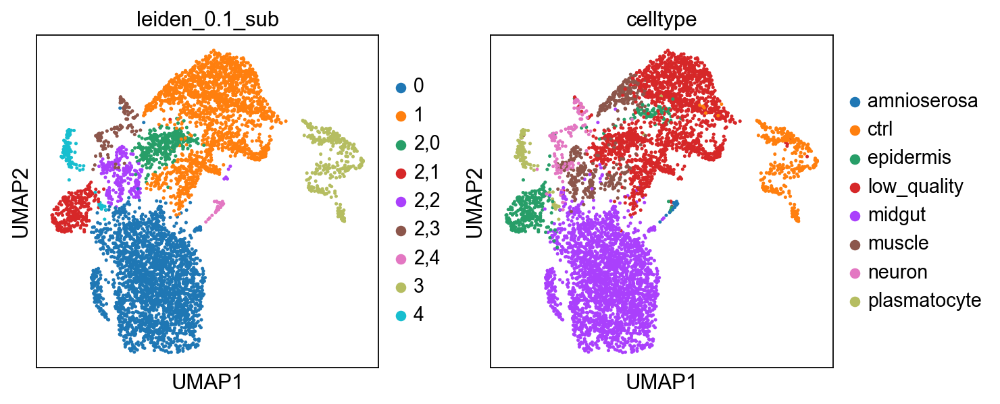

In [170]:
sc.pl.umap(adata_con, color=['leiden_0.1_sub', 'celltype'])

## HVG

In [ ]:
adata_hvg = adata.copy()

In [ ]:
sc.pp.normalize_total(adata_hvg)
sc.pp.log1p(adata_hvg)

In [ ]:
sc.pp.highly_variable_genes(adata_hvg, batch_key='batch', n_top_genes=4000)

In [ ]:
sc.pp.pca(adata_hvg)

In [ ]:
sc.pp.neighbors(adata_hvg)

In [ ]:
sc.tl.umap(adata_hvg)

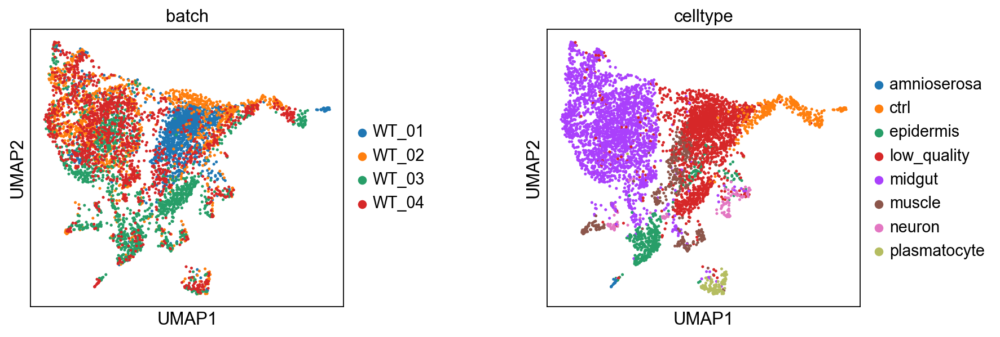

In [177]:
sc.pl.umap(adata_hvg, color=['batch', 'celltype'], wspace=0.5)

## Harmony

In [ ]:
adata_har=adata.copy()

In [ ]:
adata_har.X

In [ ]:
sc.pp.normalize_total(adata_har)
sc.pp.log1p(adata_har)

In [ ]:
sc.pp.pca(adata_har, n_comps=30)

In [ ]:
sc.external.pp.harmony_integrate(adata_har, key='batch')

In [ ]:
adata_har

In [ ]:
sc.pp.neighbors(adata_har, use_rep='X_pca_harmony')

In [ ]:
sc.tl.umap(adata_har)

In [ ]:
sc.pl.umap(adata_har, color=['batch', 'total_counts'], cmap='Reds', wspace=0.5)

In [ ]:
sc.pl.umap(adata_har, color=['batch', 'celltype', 'total_counts', 'S_score'], cmap='Reds', wspace=0.5)

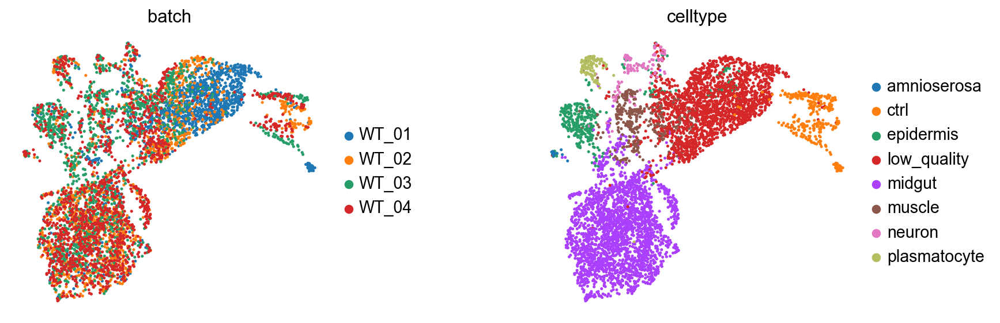

In [188]:
sc.pl.umap(adata_har, color=['batch', 'celltype'], wspace=0.5, frameon=False)

In [ ]:
sc.tl.score_genes_cell_cycle(adata_har, s_genes=sphase[0].tolist(), g2m_genes=g2m[0].tolist())

In [ ]:
sc.pl.umap(adata_har, color='S_score', cmap='Reds')

In [ ]:
sc.tl.leiden(adata_har, resolution=0.08, key_added='leiden_0.08')
sc.tl.leiden(adata_har, resolution=0.1, key_added='leiden_0.1')
sc.tl.leiden(adata_har, resolution=0.15, key_added='leiden_0.15')
sc.tl.leiden(adata_har, resolution=0.2, key_added='leiden_0.2')
sc.tl.leiden(adata_har, resolution=0.2, key_added='leiden_0.25')
sc.tl.leiden(adata_har, resolution=0.3, key_added='leiden_0.3')

In [ ]:
sc.pl.umap(adata_har, color=['leiden_0.08', 'leiden_0.1', 'leiden_0.15', 'leiden_0.2', 'leiden_0.25', 'leiden_0.3'])

## Seurat 

In [ ]:
adata_seu=adata.copy()
adata_seu

In [ ]:
adata_seu.X

In [ ]:
adata_seu.layers['raw_counts'] = adata_seu.X.copy()

In [ ]:
sc.pp.normalize_total(adata_seu)
sc.pp.log1p(adata_seu)

In [ ]:
adata_seu.layers['logcounts']=adata_seu.X.copy()

In [ ]:
# Convert categorical columns to strings
adata_seu.obs['batch'] = adata_seu.obs['batch'].astype(str)
adata_seu.obs['celltype'] = adata_seu.obs['celltype'].astype(str)
#Delete uns as this can contain arbitrary objects which are difficult to convert
del adata_seu.uns
adata_seu

In [ ]:
%%R -i adata_seu
adata_seu

In [ ]:
%%R -i adata_seu
seurat <- as.Seurat(adata_seu, counts = "raw_counts", data = "logcounts")
seurat

In [ ]:
batch_key='batch'

In [ ]:
%%R -i batch_key
batch_list <- SplitObject(seurat, split.by = batch_key)
batch_list

In [ ]:
%%R
anchors <- FindIntegrationAnchors(batch_list, anchor.features = rownames(seurat), dims=1:30)
anchors

In [ ]:
%%R
integrated <- IntegrateData(anchors, dims=1:30)
integrated

In [ ]:
%%R -o integrated_expr
# Extract the integrated expression matrix
integrated_expr <- GetAssayData(integrated)
# Make sure the rows and columns are in the same order as the original object
integrated_expr <- integrated_expr[rownames(seurat), colnames(seurat)]
# Transpose the matrix to AnnData format
integrated_expr <- t(integrated_expr)
print(integrated_expr[1:10, 1:10])

In [ ]:
adata_seu.X = integrated_expr
adata_seu.layers["seurat"] = integrated_expr
print(adata_seu)


In [ ]:
adata_seu.X.toarray()

In [ ]:
sc.pp.pca(adata_seu, )

In [ ]:
sc.pp.neighbors(adata_seu,n_pcs=30)
sc.tl.umap(adata_seu)
sc.pl.umap(adata_seu, color=['batch', 'celltype'], wspace=0.5)

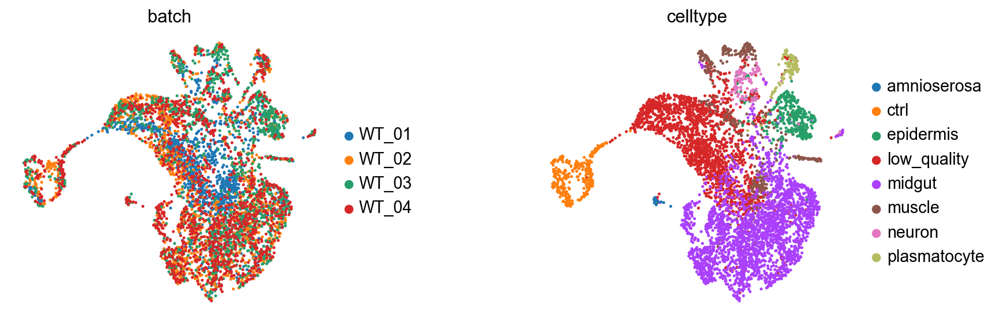

In [212]:
sc.pl.umap(adata_seu, color=['batch', 'celltype'], wspace=0.5, frameon=False)

In [ ]:
sc.tl.leiden(adata_seu, resolution=0.08, key_added='leiden_0.08')
sc.tl.leiden(adata_seu, resolution=0.1, key_added='leiden_0.1')
sc.tl.leiden(adata_seu, resolution=0.15, key_added='leiden_0.15')
sc.tl.leiden(adata_seu, resolution=0.2, key_added='leiden_0.2')
sc.tl.leiden(adata_seu, resolution=0.3, key_added='leiden_0.3')

In [ ]:
sc.pl.umap(adata_seu, color=['leiden_0.08', 'leiden_0.1', 'leiden_0.15', 'leiden_0.2','leiden_0.3', 'celltype'])

In [ ]:
sc.tl.leiden(adata_seu, restrict_to=['leiden_0.1', ['2']], resolution=0.1, key_added='leiden_0.1_sub')

In [ ]:
sc.pl.umap(adata_seu, color='leiden_0.1_sub')

In [ ]:
sc.tl.leiden(adata_seu, restrict_to=['leiden_0.1_sub', ['3']], resolution=0.02, key_added='leiden_0.1_sub_sub')

In [ ]:
sc.pl.umap(adata_seu, color=['leiden_0.1_sub_sub', 'celltype'])

In [ ]:
sc.tl.score_genes_cell_cycle(adata_seu, s_genes=sphase[0].tolist(), g2m_genes=g2m[0].tolist())

In [ ]:
sc.pl.umap(adata_seu, color='S_score', cmap='Reds')

## scVI integration

In [ ]:
import scvi

In [ ]:
adata_scvi = adata.copy()
adata_scvi

In [ ]:
adata_scvi.obs['batch'].value_counts()

In [ ]:
adata_scvi.n_obs

In [ ]:
adata_scvi.X

In [ ]:
adata_scvi.layers['raw_counts'] = adata_scvi.X.copy()

In [ ]:
scvi.model.SCVI.setup_anndata(adata_scvi, layer="raw_counts", batch_key='batch')
adata_scvi

In [ ]:
model_scvi = scvi.model.SCVI(adata_scvi)
model_scvi

In [ ]:
max_epochs_scvi = np.min([round((20000 / adata.n_obs) * 400), 400])
max_epochs_scvi

In [ ]:
5690%127

In [ ]:
model_scvi.train(batch_size=64)

In [ ]:
adata_scvi.obsm["X_scVI"] = model_scvi.get_latent_representation()

In [ ]:
sc.pp.neighbors(adata_scvi, use_rep="X_scVI")
sc.tl.umap(adata_scvi)
adata_scvi

In [ ]:
sc.tl.score_genes_cell_cycle(adata_scvi, s_genes=sphase[0].tolist(), g2m_genes=g2m[0].tolist())

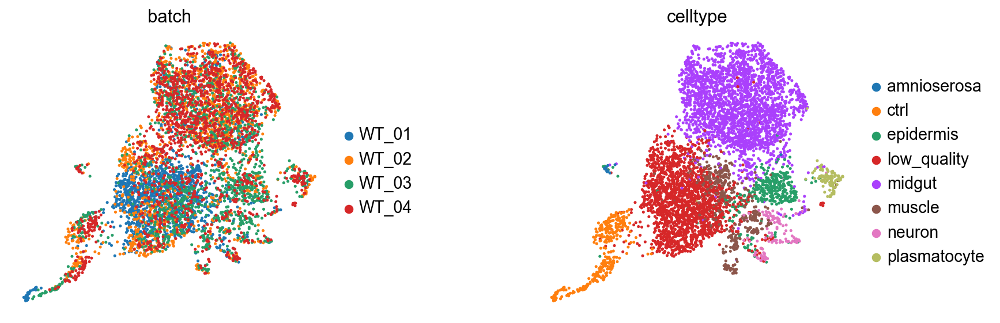

In [234]:
sc.pl.umap(adata_scvi, color=['batch', 'celltype'], wspace=0.5, frameon=False)

In [ ]:
adata_norm=adata_scvi.copy()

In [ ]:
sc.pp.normalize_total(adata_norm)
sc.pp.log1p(adata_norm)

In [ ]:
sc.tl.leiden(adata_scvi, resolution=0.08, key_added='leiden_0.08')
sc.tl.leiden(adata_scvi, resolution=0.1, key_added='leiden_0.1')
sc.tl.leiden(adata_scvi, resolution=0.15, key_added='leiden_0.15')
sc.tl.leiden(adata_scvi, resolution=0.2, key_added='leiden_0.2')
sc.tl.leiden(adata_scvi, resolution=0.3, key_added='leiden_0.3')
sc.tl.leiden(adata_scvi, resolution=0.5, key_added='leiden_0.5')


In [ ]:
sc.pl.umap(adata_scvi, color=['leiden_0.08','leiden_0.1', 'leiden_0.15', 'leiden_0.2','leiden_0.3', 'leiden_0.5', 'celltype'])

In [ ]:
sc.tl.leiden(adata_scvi, restrict_to=['leiden_0.15', ['2']], key_added='leiden_0.15_sub', resolution=0.1)

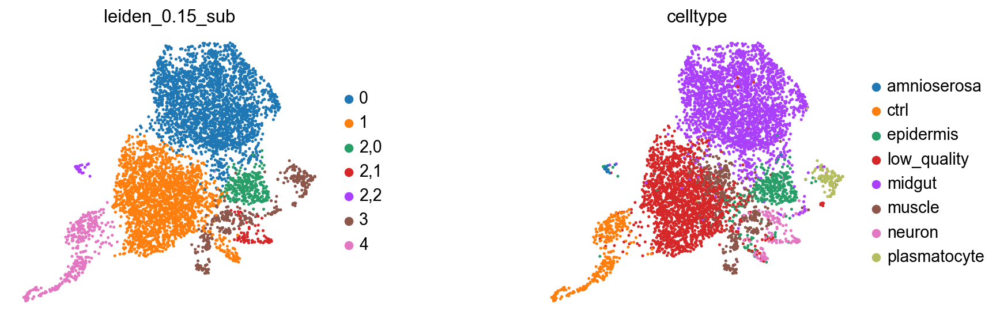

In [240]:
sc.pl.umap(adata_scvi, color=['leiden_0.15_sub', 'celltype'], wspace=0.5, frameon=False)

In [ ]:
adata_scvi

In [ ]:
print(adata.obs.dtypes)

In [ ]:
print(adata.var.dtypes)

In [ ]:
adata_scvi.write('chips_scvi_integrated.h5ad')

## Scanorama integration

In [ ]:
adata_sca=adata.copy()
adata_sca

In [ ]:
sc.pp.normalize_total(adata_sca)
sc.pp.log1p(adata_sca)

In [ ]:
sc.pp.pca(adata_sca, n_comps=30)

In [ ]:
sc.external.pp.scanorama_integrate(adata_sca, key='batch')

In [ ]:
adata_sca

In [ ]:
sc.pp.neighbors(adata_sca, use_rep='X_scanorama')

In [ ]:
sc.tl.umap(adata_sca)

In [ ]:
sc.tl.score_genes_cell_cycle(adata_sca, s_genes=sphase[0].tolist(), g2m_genes=g2m[0].tolist())

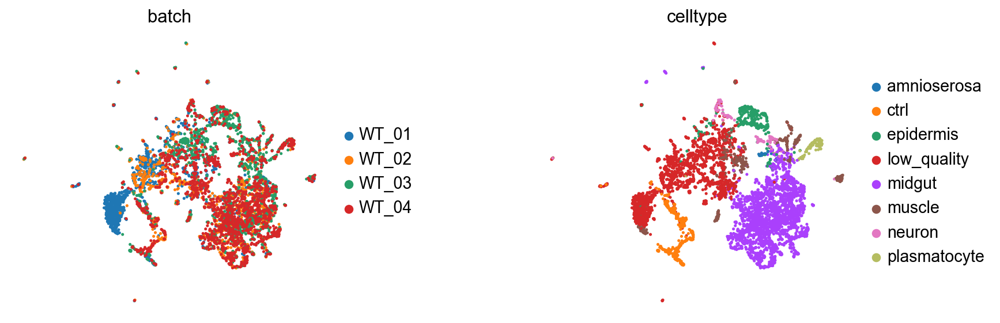

In [250]:
sc.pl.umap(adata_sca, color=['batch','celltype'], wspace=0.5, frameon=False)

In [ ]:
sc.tl.leiden(adata_sca, resolution=0.05, key_added='leiden_0.05')
sc.tl.leiden(adata_sca, resolution=0.08, key_added='leiden_0.08')
sc.tl.leiden(adata_sca, resolution=0.1, key_added='leiden_0.1')
sc.tl.leiden(adata_sca, resolution=0.2, key_added='leiden_0.2')
sc.tl.leiden(adata_sca, resolution=0.3, key_added='leiden_0.3')
sc.tl.leiden(adata_sca, resolution=0.5, key_added='leiden_0.5')

In [ ]:
sc.pl.umap(adata_sca, color=['leiden_0.05','leiden_0.08','leiden_0.1', 'leiden_0.2','leiden_0.3', 'leiden_0.5', 'celltype'])

In [ ]:
sc.tl.leiden(adata_sca, restrict_to=['leiden_0.05', ['2']], key_added='leiden_0.05_sub', resolution=0.05)

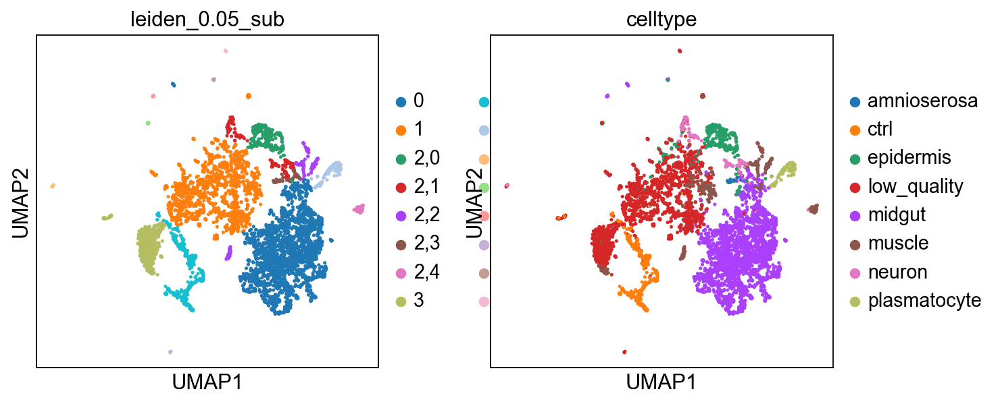

In [254]:
sc.pl.umap(adata_sca, color=['leiden_0.05_sub', 'celltype'])

## BBKNN

In [ ]:
import bbknn

In [ ]:
adata_bbk=adata.copy()
adata_bbk

In [ ]:
adata_bbk.X

In [ ]:
sc.pp.normalize_total(adata_bbk)
sc.pp.log1p(adata_bbk)

In [ ]:
adata_bbk

In [ ]:
sc.tl.pca(adata_bbk, n_comps=30) 

In [ ]:
bbknn.bbknn(
    adata_bbk, batch_key='batch', neighbors_within_batch=3
)
adata_bbk

In [ ]:
sc.tl.umap(adata_bbk)

In [ ]:
sc.tl.score_genes_cell_cycle(adata_bbk, s_genes=sphase[0].tolist(), g2m_genes=g2m[0].tolist())

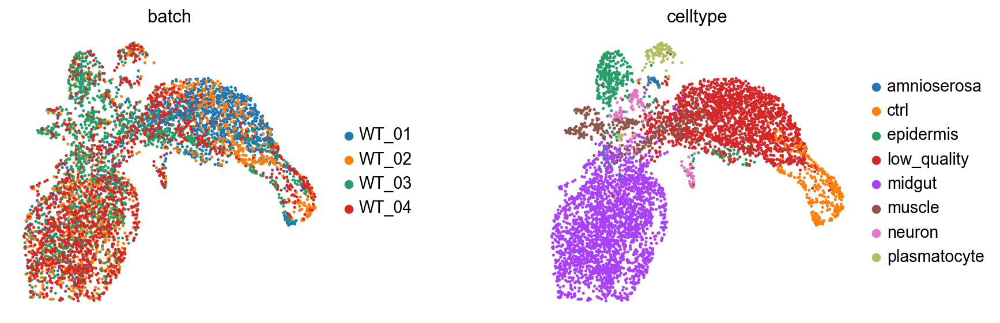

In [264]:
sc.pl.umap(adata_bbk, color=['batch', 'celltype'], wspace=0.5, frameon=False)

In [ ]:
sc.tl.leiden(adata_bbk, resolution=0.1, key_added='leiden_0.1')
sc.tl.leiden(adata_bbk, resolution=0.2, key_added='leiden_0.2')
sc.tl.leiden(adata_bbk, resolution=0.3, key_added='leiden_0.3')

In [ ]:
sc.pl.umap(adata_bbk, color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3','celltype'])

In [ ]:
sc.tl.leiden(adata_bbk, restrict_to=['leiden_0.2', ['2']], key_added='leiden_0.2_sub', resolution=0.04)

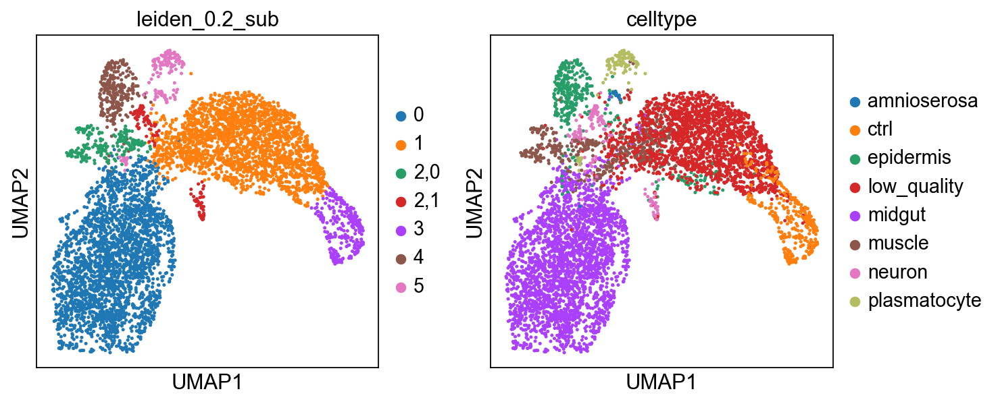

In [268]:
sc.pl.umap(adata_bbk, color=['leiden_0.2_sub', 'celltype'])

## Benchmarking the integration method

In [ ]:
pip show scanpy scib

In [ ]:
import scib

In [ ]:
metrics_scvi = scib.metrics.metrics_fast(
    adata_con, adata_scvi, batch_key='batch', label_key='celltype', embed="X_scVI")
metrics_harmony = scib.metrics.metrics_fast(adata_con, adata_har, batch_key='batch', label_key='celltype', embed='X_pca_harmony')
metrics_scanorama = scib.metrics.metrics_fast(adata_con, adata_sca, batch_key='batch', label_key='celltype', embed='X_scanorama')
metrics_bbknn = scib.metrics.metrics_fast(adata_con, adata_bbk, batch_key='batch', label_key='celltype', embed='X_pca')
metrics_seurat = scib.metrics.metrics_fast(adata_con, adata_seu, batch_key='batch', label_key='celltype', embed='X_pca')
metrics_hvg = scib.metrics.metrics_fast(adata_con, adata_hvg, batch_key='batch', label_key='celltype')

In [ ]:
# Concatenate metrics results
metrics = pd.concat(
    [metrics_scvi, metrics_harmony, metrics_scanorama, metrics_bbknn, metrics_seurat, metrics_hvg],
    axis="columns",
)
# Set methods as column names
metrics = metrics.set_axis(
    ["scVI", "Harmony", "Scanorama", "BBKNN", "Seurat", "Unintegrated"], axis="columns"
)
# Select only the fast metrics
metrics = metrics.loc[
    [
        "ASW_label",
        "ASW_label/batch",
        "PCR_batch",
        "isolated_label_silhouette",
        "graph_conn",
        "hvg_overlap",
    ],
    :,
]
# Transpose so that metrics are columns and methods are rows
metrics = metrics.T
# Remove the HVG overlap metric because it's not relevant to embedding outputs
metrics = metrics.drop(columns=["hvg_overlap"])
metrics

In [ ]:
metrics.iloc

In [ ]:
aswlabel_scvi = metrics.loc['scVI', 'ASW_label']
aswlabel_har = metrics.loc['Harmony', 'ASW_label']
aswlabel_sca = metrics.loc['Scanorama', 'ASW_label']
aswlabel_bbknn = metrics.loc['BBKNN', 'ASW_label']
aswlabel_seurat = metrics.loc['Seurat', 'ASW_label']
aswlabel_unint = metrics.loc['Unintegrated', 'ASW_label']

In [ ]:
aswbatch_scvi = metrics.loc['scVI', 'ASW_label/batch']
aswbatch_har = metrics.loc['Harmony', 'ASW_label/batch']
aswbatch_sca = metrics.loc['Scanorama', 'ASW_label/batch']
aswbatch_bbknn = metrics.loc['BBKNN', 'ASW_label/batch']
aswbatch_seurat = metrics.loc['Seurat', 'ASW_label/batch']
aswbatch_unint = metrics.loc['Unintegrated', 'ASW_label/batch']

In [ ]:
PCR_scvi = metrics.loc['scVI', 'PCR_batch']
PCR_har = metrics.loc['Harmony', 'PCR_batch']
PCR_sca = metrics.loc['Scanorama', 'PCR_batch']
PCR_bbknn = metrics.loc['BBKNN', 'PCR_batch']
PCR_seurat = metrics.loc['Seurat', 'PCR_batch']
PCR_unint = metrics.loc['Unintegrated', 'PCR_batch']

In [ ]:
silhouette_scvi = metrics.loc['scVI', 'isolated_label_silhouette']
silhouette_har = metrics.loc['Harmony', 'isolated_label_silhouette']
silhouette_sca = metrics.loc['Scanorama', 'isolated_label_silhouette']
silhoutte_bbknn = metrics.loc['BBKNN', 'isolated_label_silhouette']
silhouette_seurat = metrics.loc['Seurat', 'isolated_label_silhouette']
silhouette_unint = metrics.loc['Unintegrated', 'isolated_label_silhouette']

In [ ]:
graphconn_scvi = metrics.loc['scVI', 'graph_conn']
graphconn_har = metrics.loc['Harmony', 'graph_conn']
graphconn_sca = metrics.loc['Scanorama', 'graph_conn']
graphconn_bbknn = metrics.loc['BBKNN', 'graph_conn']
graphconn_seurat  =metrics.loc['Seurat', 'graph_conn']
graphconn_unint = metrics.loc['Unintegrated', 'graph_conn']

In [279]:
metrics.style.background_gradient(cmap="Blues")

,ASW_label,ASW_label/batch,PCR_batch,isolated_label_silhouette,graph_conn
scVI,0.592093,0.887740,0.760141,0.748190,0.991608
Harmony,0.641003,0.878616,0.250606,0.730383,0.992128
Scanorama,0.641593,0.825778,0.168919,0.724655,0.952142
BBKNN,0.633623,0.838091,0.000000,0.735234,0.944345
Seurat,0.608895,0.880178,0.931365,0.714049,0.990614
Unintegrated,0.573280,0.882132,0.000000,0.730641,0.994462


In [280]:
metrics_scaled = (metrics - metrics.min()) / (metrics.max() - metrics.min())
metrics_scaled.style.background_gradient(cmap="Blues")

,ASW_label,ASW_label/batch,PCR_batch,isolated_label_silhouette,graph_conn
scVI,0.275390,1.000000,0.816159,1.000000,0.943064
Harmony,0.991362,0.852742,0.269073,0.478408,0.953442
Scanorama,1.000000,0.000000,0.181368,0.310636,0.155578
BBKNN,0.883336,0.198717,0.000000,0.620503,0.000000
Seurat,0.521348,0.877960,1.000000,0.000000,0.923233
Unintegrated,0.000000,0.909498,0.000000,0.485968,1.000000


In [486]:
import scipy.sparse

In [662]:
# midgut primordium
gene1_expression = chip6[:, chip6.var_names == 'fkh'].layers['raw_counts']
gene2_expression = chip6[:, chip6.var_names == 'Mes2'].layers['raw_counts']

# Since the expression matrix could be sparse, convert to dense if necessary
if scipy.sparse.issparse(gene1_expression):
    gene1_expression = gene1_expression.toarray()
    gene2_expression = gene2_expression.toarray()

# Flatten arrays if they are not already
gene1_expression = np.ravel(gene1_expression)
gene2_expression = np.ravel(gene2_expression)

# Calculate the xth percentile threshold for both genes
threshold_gene1 = np.percentile(gene1_expression, 99)
threshold_gene2 = np.percentile(gene2_expression, 99)

# Step 2: Identify cells with gene1 expression above the xth percentile
cells_above_threshold_gene1 = gene1_expression > threshold_gene1

# Step 3: Among these cells, find those with gene2 expression above its xth percentile
# Note: We apply the mask from step 2 to gene2_expression to only consider the relevant cells
cells_above_threshold_gene2_among_gene1 = (gene2_expression[cells_above_threshold_gene1] > threshold_gene2)

# Since cells_above_threshold_gene2_among_gene1 is indexed relative to the filtered gene1 cells,
# we need to map back to the original cell indices
final_cell_indices = np.where(cells_above_threshold_gene1)[0][cells_above_threshold_gene2_among_gene1]

# Extract the cell IDs for these cells
start_cell = chip6.obs_names[final_cell_indices].tolist()

start_cell

['AGATACTATACTAAGT', 'AGCAGAGCCGTTCCGA']

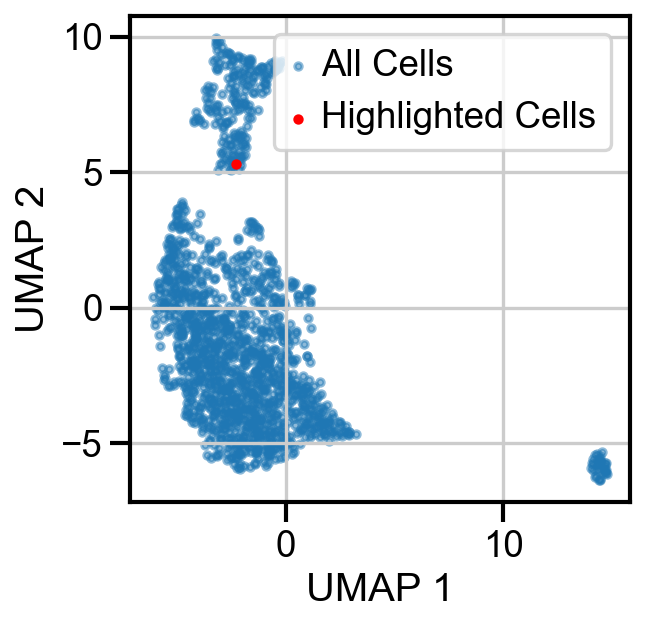

In [665]:
# Create a boolean mask for the cells to highlight
highlight_mask = chip6.obs_names.isin(['AGATACTATACTAAGT'])

# UMAP coordinates
umap_coords = chip6.obsm['X_umap']

# Plot all cells in a light color
plt.scatter(umap_coords[:, 0], umap_coords[:, 1], s=10, alpha=0.5, label='All Cells')

# Plot highlighted cells in a different color
plt.scatter(umap_coords[highlight_mask, 0], umap_coords[highlight_mask, 1], s=10, color='red', label='Highlighted Cells')

plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend()
plt.show()

/Users/grosshanslab/python/py310/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/Users/grosshanslab/python/py310/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1208: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(values):


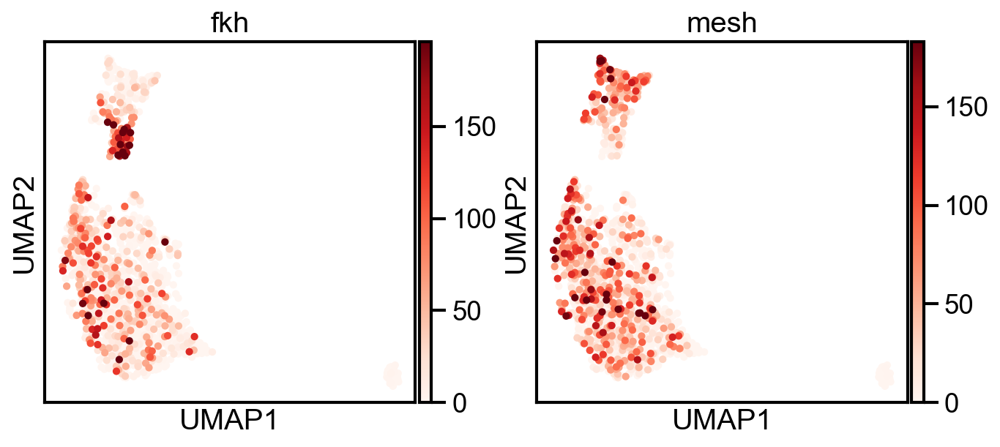

In [563]:
sc.pl.umap(chip6, color=['fkh', 'mesh'], cmap='Reds', use_raw=True, vmax='p99')

In [666]:
root_chip6 = chip6.obs.index.get_loc('AGATACTATACTAAGT')

In [667]:
chip6.uns['iroot'] = root_chip6

In [668]:
sc.tl.dpt(chip6)

In [576]:
chip6

AnnData object with n_obs × n_vars = 1415 × 14098
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'outlier', 'mt_outlier', 'leiden_0.1', 'leiden_0.2', 'leiden_0.2_sub', 'leiden_0.2_sub_sub', 'celltype', 'S_score', 'G2M_score', 'phase', 'dpt_pseudotime'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_0.1_colors', 'leiden_0.2_colors', 'leiden_0.2_sub_colors', 'leiden_0.2_sub_sub_colors', 'rank_genes_groups', 'dendrogram_leiden_0.2_sub_sub', 'celltype_colors', 'phase_colors', 'iroot', 'diffmap_evals'
    obsm: 'X_pca', 'X_umap', 'X_diffmap'
    varm: 'PCs'
    layers: 'raw_counts'
    obsp: 'distances', 

/Users/grosshanslab/python/py310/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/Users/grosshanslab/python/py310/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1208: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not is_categorical_dtype(values):


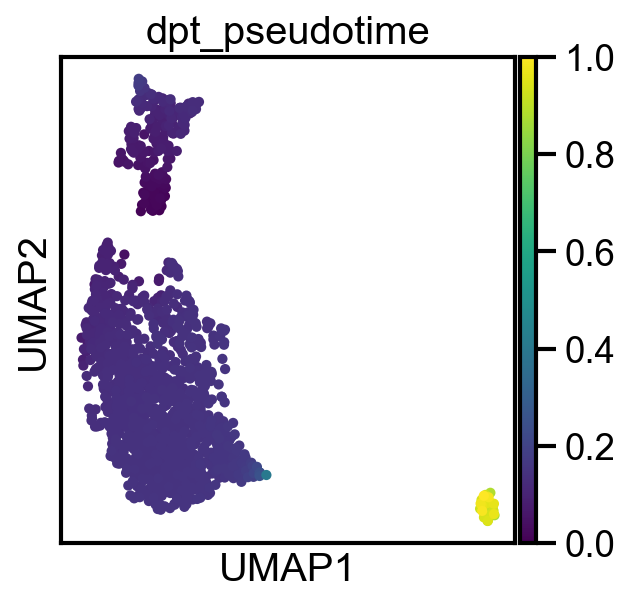

In [577]:
sc.pl.umap(chip6, color='dpt_pseudotime')

In [571]:
chip6.obs_names

Index(['AGAGTTCTCGTTGGTT', 'CATAATGGCGTTGGTT', 'TATACGGACGTTGGTT',
       'CTAGCGACCGTTGGTT', 'TCATCGAACGTTGGTT', 'ATTCAAGGCGTTGGTT',
       'TGATTCCGCGTTGGTT', 'CCGCAGTCCGTTGGTT', 'CCGTACGCCGTTGGTT',
       'CCATTCTTCGTTGGTT',
       ...
       'GATGCGTTAGAAGTAA', 'GAGATTCTAGAAGTAA', 'CTAAGCATAGAAGTAA',
       'TGCGCTCCAGAAGTAA', 'CGTCGAGGAGAAGTAA', 'CGCGGTCGAGAAGTAA',
       'TCTCCTAGAGAAGTAA', 'TCAATCAGAGAAGTAA', 'TTAACTGAAGAAGTAA',
       'ATATGCAAAGAAGTAA'],
      dtype='object', length=1415)

/Users/grosshanslab/python/py310/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/grosshanslab/python/py310/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


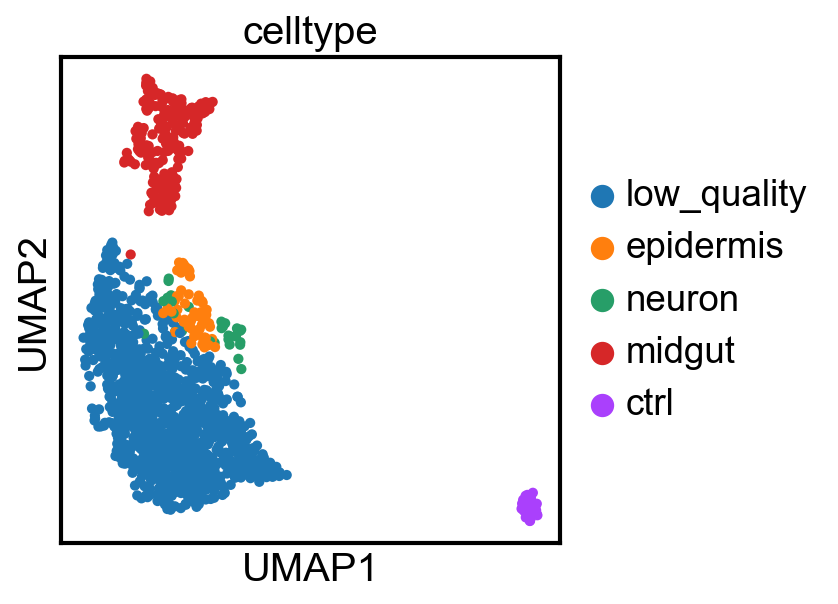

In [588]:
sc.pl.umap(chip6, color='celltype')

## Subset midgut then do TI

### Chip6_midgut

In [ ]:
mg_chip6 = chip6 [chip6.obs['celltype']=='midgut']
mg_chip6

In [ ]:
sc.pl.umap(mg_chip6, color=['fkh', 'mesh', 'lab', 'drm', 'mirr', 'Bx', 'fzr', 'zfh2', 'zfh1','sna', 'esg', 'hdc'], cmap='Reds', vmax='p99')

In [ ]:
root_chip6 = mg_chip6.obs.index.get_loc('AGATACTATACTAAGT')

In [ ]:
mg_chip6.uns['iroot'] = root_chip6

In [ ]:
sc.tl.dpt(mg_chip6)

In [ ]:
sc.pl.umap(mg_chip6, color='dpt_pseudotime')

### Chip7_midgut

In [ ]:
mg_chip7 = chip7 [chip7.obs['celltype']=='midgut']
mg_chip7

In [ ]:
sc.pl.umap(mg_chip7, color=['fkh', 'mesh', 'lab', 'drm', 'mirr', 'Tre1', 'Bx', 'fzr', 'zfh2', 'zfh1','sna', 'esg', 'hdc'], cmap='Reds', vmax='p99')

In [ ]:
mg_chip7.X=mg_chip7.layers['raw_counts']
mg_chip7.X

In [ ]:
sc.pp.normalize_total(mg_chip7)
sc.pp.log1p(mg_chip7)

In [ ]:
sc.pp.pca(mg_chip7)
sc.pp.neighbors(mg_chip7, n_pcs=30)
sc.tl.umap(mg_chip7)

In [ ]:
sc.pl.umap(mg_chip7, color=['fkh', 'mesh', 'lab', 'drm', 'mirr', 'Tre1'], cmap='Reds', vmax='p99')

In [ ]:
#midgut primordium 
gene1_expression = mg_chip7[:, mg_chip7.var_names == 'fkh'].layers['raw_counts']
gene2_expression = mg_chip7[:, mg_chip7.var_names == 'Mes2'].layers['raw_counts']

# Flatten arrays if they are not already
gene1_expression = np.ravel(gene1_expression)
gene2_expression = np.ravel(gene2_expression)

# Calculate the xth percentile threshold for both genes
threshold_gene1 = np.percentile(gene1_expression, 99)
threshold_gene2 = np.percentile(gene2_expression, 95)

# Step 2: Identify cells with gene1 expression above the xth percentile
cells_above_threshold_gene1 = gene1_expression > threshold_gene1

# Step 3: Among these cells, find those with gene2 expression above its xth percentile
# Note: We apply the mask from step 2 to gene2_expression to only consider the relevant cells
cells_above_threshold_gene2_among_gene1 = (gene2_expression[cells_above_threshold_gene1] > threshold_gene2)

# Since cells_above_threshold_gene2_among_gene1 is indexed relative to the filtered gene1 cells,
# we need to map back to the original cell indices
final_cell_indices = np.where(cells_above_threshold_gene1)[0][cells_above_threshold_gene2_among_gene1]

# Extract the cell IDs for these cells
start_cell = mg_chip7.obs_names[final_cell_indices].tolist()

start_cell

In [ ]:
# Create a boolean mask for the cells to highlight
highlight_mask = mg_chip7.obs_names.isin(start_cell)

# UMAP coordinates
umap_coords = mg_chip7.obsm['X_umap']

# Plot all cells in a light color
plt.scatter(umap_coords[:, 0], umap_coords[:, 1], s=10, alpha=0.5, label='All Cells')

# Plot highlighted cells in a different color
plt.scatter(umap_coords[highlight_mask, 0], umap_coords[highlight_mask, 1], s=10, color='red', label='Highlighted Cells')

plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend()
plt.show()

In [ ]:
root_chip7 = mg_chip7.obs.index.get_loc('CGTATGAACGTTCCGA')

In [ ]:
mg_chip7.uns['iroot'] = root_chip7

In [ ]:
sc.tl.dpt(mg_chip7)

In [ ]:
sc.pl.umap(mg_chip7, color='dpt_pseudotime')

### Chip8_midgut

In [ ]:
mg_chip8 = chip8[chip8.obs['celltype']=='midgut']
mg_chip8

In [ ]:
sc.pl.umap(mg_chip8, color=['fkh', 'mesh', 'lab', 'drm', 'mirr', 'Tre1', 'Bx', 'fzr', 'zfh2', 'zfh1','sna', 'esg', 'hdc'], cmap='Reds', vmax='p99')

In [ ]:
mg_chip8.X = mg_chip8.layers['raw_counts']
mg_chip8.X

In [ ]:
sc.pp.normalize_total(mg_chip8)
sc.pp.log1p(mg_chip8)

In [ ]:
sc.pp.pca(mg_chip8)

In [ ]:
sc.pp.neighbors(mg_chip8, n_pcs=30)

In [ ]:
sc.tl.umap(mg_chip8)

In [ ]:
sc.pl.umap(mg_chip8, color=['fkh', 'mesh', 'lab', 'drm', 'mirr', 'Tre1'], cmap='Reds', vmax='p99')

In [ ]:
#midgut primordium 
gene1_expression = mg_chip8[:, mg_chip8.var_names == 'fkh'].layers['raw_counts']
gene2_expression = mg_chip8[:, mg_chip8.var_names == 'Mes2'].layers['raw_counts']

# Flatten arrays if they are not already
gene1_expression = np.ravel(gene1_expression)
gene2_expression = np.ravel(gene2_expression)

# Calculate the xth percentile threshold for both genes
threshold_gene1 = np.percentile(gene1_expression, 99)
threshold_gene2 = np.percentile(gene2_expression, 95)

# Step 2: Identify cells with gene1 expression above the xth percentile
cells_above_threshold_gene1 = gene1_expression > threshold_gene1

# Step 3: Among these cells, find those with gene2 expression above its xth percentile
# Note: We apply the mask from step 2 to gene2_expression to only consider the relevant cells
cells_above_threshold_gene2_among_gene1 = (gene2_expression[cells_above_threshold_gene1] > threshold_gene2)

# Since cells_above_threshold_gene2_among_gene1 is indexed relative to the filtered gene1 cells,
# we need to map back to the original cell indices
final_cell_indices = np.where(cells_above_threshold_gene1)[0][cells_above_threshold_gene2_among_gene1]

# Extract the cell IDs for these cells
start_cell = mg_chip8.obs_names[final_cell_indices].tolist()

start_cell

In [ ]:
# Create a boolean mask for the cells to highlight
highlight_mask = mg_chip8.obs_names.isin(start_cell)

# UMAP coordinates
umap_coords = mg_chip8.obsm['X_umap']

# Plot all cells in a light color
plt.scatter(umap_coords[:, 0], umap_coords[:, 1], s=10, alpha=0.5, label='All Cells')

# Plot highlighted cells in a different color
plt.scatter(umap_coords[highlight_mask, 0], umap_coords[highlight_mask, 1], s=10, color='red', label='Highlighted Cells')

plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend()
plt.show()

In [ ]:
root_chip8 = mg_chip8.obs.index.get_loc('TCCTCCGTAGACCGTT')

In [ ]:
mg_chip8.uns['iroot'] = root_chip8

In [ ]:
sc.tl.dpt(mg_chip8)

In [ ]:
sc.pl.umap(mg_chip8, color='dpt_pseudotime')

### Chip9_midgut

In [ ]:
mg_chip9 = chip9[chip9.obs['celltype']=='midgut']
mg_chip9

In [ ]:
sc.pl.umap(mg_chip9, color='leiden_0.2_sub_3x')

In [ ]:
mg_chip9 = mg_chip9[mg_chip9.obs['leiden_0.2_sub_3x']!='4,0']
mg_chip9

In [ ]:
mg_chip9.X=mg_chip9.layers['raw_counts']
mg_chip9.X

In [ ]:
sc.pp.normalize_total(mg_chip9)
sc.pp.log1p(mg_chip9)

In [ ]:
sc.pp.pca(mg_chip9)
sc.pp.neighbors(mg_chip9, n_pcs=30)
sc.tl.umap(mg_chip9)

In [ ]:
sc.pl.umap(mg_chip9,  color=['fkh', 'mesh', 'lab', 'drm', 'mirr', 'Tre1'], cmap='Reds', vmax='p99')

In [ ]:
#midgut primordium 
gene1_expression = mg_chip9[:, mg_chip9.var_names == 'fkh'].layers['raw_counts']
gene2_expression = mg_chip9[:, mg_chip9.var_names == 'Mes2'].layers['raw_counts']

# Flatten arrays if they are not already
gene1_expression = np.ravel(gene1_expression)
gene2_expression = np.ravel(gene2_expression)

# Calculate the xth percentile threshold for both genes
threshold_gene1 = np.percentile(gene1_expression, 99)
threshold_gene2 = np.percentile(gene2_expression, 92)

# Step 2: Identify cells with gene1 expression above the xth percentile
cells_above_threshold_gene1 = gene1_expression > threshold_gene1

# Step 3: Among these cells, find those with gene2 expression above its xth percentile
# Note: We apply the mask from step 2 to gene2_expression to only consider the relevant cells
cells_above_threshold_gene2_among_gene1 = (gene2_expression[cells_above_threshold_gene1] > threshold_gene2)

# Since cells_above_threshold_gene2_among_gene1 is indexed relative to the filtered gene1 cells,
# we need to map back to the original cell indices
final_cell_indices = np.where(cells_above_threshold_gene1)[0][cells_above_threshold_gene2_among_gene1]

# Extract the cell IDs for these cells
start_cell = mg_chip9.obs_names[final_cell_indices].tolist()

start_cell

In [ ]:
# Create a boolean mask for the cells to highlight
highlight_mask = mg_chip9.obs_names.isin(start_cell)

# UMAP coordinates
umap_coords = mg_chip9.obsm['X_umap']

# Plot all cells in a light color
plt.scatter(umap_coords[:, 0], umap_coords[:, 1], s=10, alpha=0.5, label='All Cells')

# Plot highlighted cells in a different color
plt.scatter(umap_coords[highlight_mask, 0], umap_coords[highlight_mask, 1], s=10, color='red', label='Highlighted Cells')

plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend()
plt.show()

In [ ]:
root_chip9 = mg_chip9.obs.index.get_loc('GTCGTTCTCGTTCCGA')

In [ ]:
mg_chip9.uns['iroot'] = root_chip9

In [ ]:
sc.tl.dpt(mg_chip9)

In [ ]:
sc.pl.umap(mg_chip9, color='dpt_pseudotime')

In [ ]:
mg_chip9

### clustering and integrating midgut cells for trajectory conservation analysis

In [ ]:
sc.tl.leiden(mg_chip6, resolution=0.2, key_added='leiden_0.2')
sc.tl.leiden(mg_chip7, resolution=0.3, key_added='leiden_0.3')
sc.tl.leiden(mg_chip8, resolution=0.3, key_added='leiden_0.3')
sc.tl.leiden(mg_chip9, resolution=0.3, key_added='leiden_0.3')

In [ ]:
p1 = sc.pl.umap(mg_chip6, color='leiden_0.2')
p2 = sc.pl.umap(mg_chip7, color='leiden_0.3')
p3 = sc.pl.umap(mg_chip8, color='leiden_0.3')
p4 = sc.pl.umap(mg_chip9, color='leiden_0.3')

In [ ]:
mg_chip6.obs['midgut_celltype'] = mg_chip6.obs['leiden_0.2'].map({'0':'late', '1':'early'})
mg_chip7.obs['midgut_celltype'] = mg_chip7.obs['leiden_0.3'].map({'0':'early', '1':'late', '2':'AMG', '3':'MMG', '4':'ICPs'})
mg_chip8.obs['midgut_celltype'] = mg_chip8.obs['leiden_0.3'].map({'0':'late', '1':'early', '2':'AMG+ICPs', '3':'MMG'})
mg_chip9.obs['midgut_celltype'] = mg_chip9.obs['leiden_0.3'].map({'0':'late', '1':'early', '2':'MMG', '3':'AMG'})

In [ ]:
sc.tl.score_genes_cell_cycle(mg_chip6, s_genes=sphase[0].tolist(), g2m_genes=g2m[0].tolist(), use_raw=True)
sc.tl.score_genes_cell_cycle(mg_chip7, s_genes=sphase[0].tolist(), g2m_genes=g2m[0].tolist(), use_raw=True)
sc.tl.score_genes_cell_cycle(mg_chip8, s_genes=sphase[0].tolist(), g2m_genes=g2m[0].tolist(), use_raw=True)
sc.tl.score_genes_cell_cycle(mg_chip9, s_genes=sphase[0].tolist(), g2m_genes=g2m[0].tolist(), use_raw=True)

### Concating midgut

In [ ]:
midgut_con = mg_chip6.concatenate(mg_chip7, mg_chip8, mg_chip9, batch_categories=['WT_01', 'WT_02', 'WT_03', 'WT_04'], uns_merge=None)
midgut_con

In [ ]:
midgut_con.obs

### Harmony - pseudotime, cell cycle, hvg

In [ ]:
midgut_har = adata_har[adata_har.obs_names.isin(midgut_con.obs_names)]
midgut_har

In [ ]:
midgut_har = midgut_har[:,midgut_har.var_names.isin(midgut_con.var_names)]
midgut_har

In [ ]:
sc.pp.pca(midgut_har, n_comps=30)

In [ ]:
sc.external.pp.harmony_integrate(midgut_har, key='batch')

In [ ]:
midgut_har

In [ ]:
sc.pp.neighbors(midgut_har, use_rep='X_pca_harmony')

In [ ]:
sc.tl.umap(midgut_har)

In [ ]:
sc.pl.umap(midgut_har, color=['fkh', 'mesh','DNaseII', 'lab', 'drm', 'mirr', 'Tre1', 'grh', 'dve', 'GATAe', 'zfh1', 'zfh2', 'sna', 'esg', 'ara'], cmap='Reds', vmax='p99')

In [ ]:
sc.tl.leiden(midgut_har, resolution=0.2, key_added='leiden_0.2')
sc.tl.leiden(midgut_har, resolution=0.3, key_added='leiden_0.3')

In [ ]:
sc.pl.umap(midgut_har, color=['leiden_0.2','leiden_0.3'])

In [ ]:
sc.tl.rank_genes_groups(midgut_har, groupby='leiden_0.2', use_raw=False, method='wilcoxon')

In [ ]:
sc.pl.rank_genes_groups_dotplot(midgut_har, standard_scale='var', n_genes=20)

In [ ]:
#NOTE cell annotation is not detailed, it is just in a low resolution to be similar to the 'before integration' situation

midgut_har.obs['midgut_celltype'] = midgut_har.obs['leiden_0.2'].map({'0':'early', '1':'late', '2':'AMG', '3':'MMG', '4':'early'})

In [ ]:
sc.pl.umap(midgut_har, color='midgut_celltype')

In [ ]:
trajectory_har = scib.metrics.trajectory_conservation(midgut_con, midgut_har, label_key='midgut_celltype')

In [ ]:
trajectory_har

In [ ]:
midgut_har

In [ ]:
sc.pl.umap(midgut_har, color=['S_score', 'G2M_score', 'CycE'], cmap='Reds')

In [ ]:
cycle_har = scib.metrics.cell_cycle(midgut_con, midgut_har, batch_key='batch',recompute_cc=False, embed=None)
cycle_har

In [ ]:
hvg_har = scib.metrics.hvg_overlap(midgut_con, midgut_har, batch_key='batch', n_hvg=2000)
hvg_har

### scvi - pseudotime, cell cycle, hvg

In [ ]:
midgut_scvi = adata_scvi[adata_scvi.obs_names.isin(midgut_con.obs_names)]
midgut_scvi

In [ ]:
midgut_scvi = midgut_scvi[:,midgut_scvi.var_names.isin(midgut_con.var_names)]
midgut_scvi

In [ ]:
midgut_scvi = midgut_scvi.copy()

In [ ]:
scvi.model.SCVI.setup_anndata(midgut_scvi, layer="raw_counts", batch_key='batch')
midgut_scvi

In [ ]:
model_scvi_mg = scvi.model.SCVI(midgut_scvi)
model_scvi_mg

In [ ]:
max_epochs_scvi = np.min([round((20000 / midgut_scvi.n_obs) * 400), 400])
max_epochs_scvi

In [ ]:
model_scvi_mg.train()

In [ ]:
midgut_scvi.obsm["X_scVI"] = model_scvi_mg.get_latent_representation()

In [ ]:
sc.pp.neighbors(midgut_scvi, use_rep="X_scVI")
sc.tl.umap(midgut_scvi)
midgut_scvi

In [ ]:
sc.pl.umap(midgut_scvi, color=['fkh', 'mesh', 'lab', 'drm', 'mirr', 'Tre1', 'grh', 'dve', 'GATAe', 'zfh2', 'zfh1','sna', 'esg', 'hdc'], cmap='Reds', vmax='p99')

In [ ]:
sc.tl.leiden(midgut_scvi, resolution=0.1, key_added='leiden_0.1')
sc.tl.leiden(midgut_scvi, resolution=0.2, key_added='leiden_0.2')
sc.tl.leiden(midgut_scvi, resolution=0.3, key_added='leiden_0.3')
sc.tl.leiden(midgut_scvi, resolution=0.4, key_added='leiden_0.4')
sc.tl.leiden(midgut_scvi, resolution=0.5, key_added='leiden_0.5')

In [ ]:
sc.pl.umap(midgut_scvi, color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3','leiden_0.4', 'leiden_0.5'])

In [ ]:
#NOTE cell annotation is not detailed, it is just in a low resolution to be similar to the 'before integration' situation

midgut_scvi.obs['midgut_celltype'] = midgut_scvi.obs['leiden_0.3'].map({'0':'early', '1':'late', '2':'AMG', '3':'MMG'})

In [ ]:
sc.pl.umap(midgut_scvi, color='midgut_celltype')

In [ ]:
trajectory_scvi = scib.metrics.trajectory_conservation(midgut_con, midgut_scvi, label_key='midgut_celltype')

In [ ]:
trajectory_scvi

In [ ]:
midgut_scvi.obs['S_score']

In [ ]:
midgut_scvi.obs['S_score']

In [ ]:
sc.pl.umap(midgut_scvi, color=['S_score', 'G2M_score', 'CycE'], cmap='Reds')

In [ ]:
cycle_scvi = scib.metrics.cell_cycle(midgut_con, midgut_scvi, batch_key='batch', recompute_cc=False, embed = 'X_scVI')
cycle_scvi

In [ ]:
hvg_scvi = scib.metrics.hvg_overlap(midgut_con, midgut_scvi, batch_key='batch', n_hvg=2000)
hvg_scvi

### seurat - pseudotime, cell cycle, hvg

In [ ]:
midgut_seu=adata.copy()
midgut_seu

In [ ]:
midgut_seu = midgut_seu[midgut_seu.obs_names.isin(midgut_con.obs_names)]
midgut_seu

In [ ]:
midgut_seu = midgut_seu[:,midgut_seu.var_names.isin(midgut_con.var_names)]
midgut_seu

In [ ]:
midgut_seu.X

In [ ]:
midgut_seu.layers['raw_counts'] = midgut_seu.X.copy()

In [ ]:
sc.pp.normalize_total(midgut_seu)
sc.pp.log1p(midgut_seu)

In [ ]:
midgut_seu.layers['logcounts']=midgut_seu.X.copy()

In [ ]:
# Convert categorical columns to strings
midgut_seu.obs['batch'] = midgut_seu.obs['batch'].astype(str)
midgut_seu.obs['celltype'] = midgut_seu.obs['celltype'].astype(str)
#Delete uns as this can contain arbitrary objects which are difficult to convert
del midgut_seu.uns
midgut_seu

In [ ]:
%%R -i midgut_seu
midgut_seu

In [ ]:
%%R -i midgut_seu
seurat <- as.Seurat(midgut_seu, counts = "raw_counts", data = "logcounts")
seurat

In [ ]:
batch_key='batch'

In [ ]:
%%R -i batch_key
batch_list <- SplitObject(seurat, split.by = batch_key)
batch_list

In [ ]:
%%R
anchors <- FindIntegrationAnchors(batch_list, anchor.features = rownames(seurat), dims=1:30)
anchors

In [ ]:
%%R
integrated <- IntegrateData(anchors, dims=1:30)
integrated

In [ ]:
%%R -o integrated_expr
# Extract the integrated expression matrix
integrated_expr <- GetAssayData(integrated)
# Make sure the rows and columns are in the same order as the original object
integrated_expr <- integrated_expr[rownames(seurat), colnames(seurat)]
# Transpose the matrix to AnnData format
integrated_expr <- t(integrated_expr)
print(integrated_expr[1:10, 1:10])

In [ ]:
midgut_seu.X = integrated_expr
midgut_seu.layers["seurat"] = integrated_expr
print(midgut_seu)


In [ ]:
midgut_seu.X.toarray()

In [ ]:
sc.pp.pca(midgut_seu, )

In [ ]:
sc.pp.neighbors(midgut_seu,n_pcs=30)
sc.tl.umap(midgut_seu)
sc.pl.umap(midgut_seu, color=['batch', 'celltype'])

In [ ]:
sc.pl.umap(midgut_seu, color=['fkh', 'mesh', 'lab', 'drm', 'mirr', 'Tre1','Bx', 'fzr', 'grh', 'dve', 'GATAe', 'zfh2', 'zfh1','sna', 'esg', 'hdc', 'pros'], cmap='Reds', vmax='p99')

In [ ]:
sc.tl.leiden(midgut_seu, resolution=0.1, key_added='leiden_0.1')
sc.tl.leiden(midgut_seu, resolution=0.2, key_added='leiden_0.2')
sc.tl.leiden(midgut_seu, resolution=0.3, key_added='leiden_0.3')
sc.tl.leiden(midgut_seu, resolution=0.4, key_added='leiden_0.4')
sc.tl.leiden(midgut_seu, resolution=0.5, key_added='leiden_0.5')

In [ ]:
sc.pl.umap(midgut_seu, color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3','leiden_0.4', 'leiden_0.5'])

In [ ]:
#NOTE cell annotation is not detailed, it is just in a low resolution to be similar to the 'before integration' situation

midgut_seu.obs['midgut_celltype'] = midgut_seu.obs['leiden_0.2'].map({'0':'early', '1':'late', '2':'AMG', '3':'MMG', '4':'early'})

In [ ]:
sc.pl.umap(midgut_seu, color='midgut_celltype')

In [ ]:
trajectory_seurat = scib.metrics.trajectory_conservation(midgut_con, midgut_seu, label_key='midgut_celltype')

In [ ]:
trajectory_seurat

In [ ]:
cycle_seurat = scib.metrics.cell_cycle(midgut_con, midgut_seu, batch_key='batch', embed='X_pca')
cycle_seurat

In [ ]:
cycle_seurat = scib.metrics.cell_cycle(midgut_con, midgut_seu, batch_key='batch',recompute_cc=False, embed=None)
cycle_seurat

In [ ]:
hvg_seurat = scib.metrics.hvg_overlap(midgut_con, midgut_seu, batch_key='batch', n_hvg=2000)
hvg_seurat

### scanorama - pseudotime, cell cycle, hvg

In [ ]:
midgut_sca=adata.copy()
midgut_sca

In [ ]:
midgut_sca = midgut_sca[midgut_sca.obs_names.isin(midgut_con.obs_names)]
midgut_sca

In [ ]:
midgut_sca = midgut_sca[:, midgut_sca.var_names.isin(midgut_con.var_names)]
midgut_sca

In [ ]:
sc.pp.normalize_total(midgut_sca)
sc.pp.log1p(midgut_sca)

In [ ]:
sc.pp.pca(midgut_sca, n_comps=30)

In [ ]:
sc.external.pp.scanorama_integrate(midgut_sca, key='batch')

In [ ]:
midgut_sca

In [ ]:
sc.pp.neighbors(midgut_sca, use_rep='X_scanorama')

In [ ]:
sc.tl.umap(midgut_sca)

In [ ]:
sc.pl.umap(midgut_sca, color=['fkh', 'mesh', 'lab', 'drm', 'mirr', 'Tre1', 'grh', 'dve', 'GATAe'], cmap='Reds', vmax='p99')

In [ ]:
sc.tl.leiden(midgut_sca, resolution=0.1, key_added='leiden_0.1')
sc.tl.leiden(midgut_sca, resolution=0.2, key_added='leiden_0.2')
sc.tl.leiden(midgut_sca, resolution=0.3, key_added='leiden_0.3')
sc.tl.leiden(midgut_sca, resolution=0.4, key_added='leiden_0.4')
sc.tl.leiden(midgut_sca, resolution=0.5, key_added='leiden_0.5')

In [ ]:
sc.pl.umap(midgut_sca, color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5'])

In [ ]:
midgut_sca.obs['midgut_celltype'] = midgut_sca.obs['leiden_0.2'].map({'0':'late', '1':'early', '2':'early', '3':'MMG', '4':'AMG', '5':'early', '6':'late', '7':'late'})

In [ ]:
sc.pl.umap(midgut_sca, color='midgut_celltype')

In [ ]:
trajectory_sca = scib.metrics.trajectory_conservation(midgut_con, midgut_sca, label_key='midgut_celltype')
trajectory_sca

In [ ]:
cycle_sca = scib.metrics.cell_cycle(midgut_con, midgut_sca, batch_key='batch',recompute_cc=False, embed = 'X_pca')
cycle_sca

In [ ]:
hvg_sca = scib.metrics.hvg_overlap(midgut_con, midgut_sca, batch_key='batch', n_hvg=2000)
hvg_sca

### BBKNN - pseudotime, cell cycle, hvg

In [ ]:
midgut_bbk=adata.copy()
midgut_bbk

In [ ]:
midgut_bbk = midgut_bbk[midgut_bbk.obs_names.isin(midgut_con.obs_names)]
midgut_bbk

In [ ]:
midgut_bbk = midgut_bbk[:,midgut_bbk.var_names.isin(midgut_con.var_names)]
midgut_bbk

In [ ]:
sc.pp.normalize_total(midgut_bbk)
sc.pp.log1p(midgut_bbk)

In [ ]:
sc.pp.pca(midgut_bbk) 

In [ ]:
bbknn.bbknn(
    midgut_bbk, batch_key='batch', neighbors_within_batch=3
)
midgut_bbk

In [ ]:
sc.tl.umap(midgut_bbk)

In [ ]:
sc.pl.umap(midgut_bbk, color=['fkh', 'mesh', 'lab', 'drm', 'mirr', 'Tre1', 'grh', 'dve', 'GATAe'], cmap='Reds', vmax='p99')

In [ ]:
sc.tl.leiden(midgut_bbk, resolution=0.1, key_added='leiden_0.1')
sc.tl.leiden(midgut_bbk, resolution=0.2, key_added='leiden_0.2')
sc.tl.leiden(midgut_bbk, resolution=0.3, key_added='leiden_0.3')
sc.tl.leiden(midgut_bbk, resolution=0.4, key_added='leiden_0.4')
sc.tl.leiden(midgut_bbk, resolution=0.5, key_added='leiden_0.5')

In [ ]:
sc.pl.umap(midgut_bbk, color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5'])

In [ ]:
midgut_bbk.obs['midgut_celltype'] = midgut_bbk.obs['leiden_0.3'].map({'0':'late', '1':'early', '2':'early', '3':'AMG', '4':'MMG', '5':'early'})

In [ ]:
sc.pl.umap(midgut_bbk, color='midgut_celltype')

In [ ]:
trajectory_bbknn = scib.metrics.trajectory_conservation(midgut_con, midgut_bbk, label_key='midgut_celltype')
trajectory_bbknn

In [ ]:
cycle_bbknn = scib.metrics.cell_cycle(midgut_con, midgut_bbk, batch_key='batch',recompute_cc=False, embed = 'X_pca')
cycle_bbknn

In [ ]:
hvg_bbknn = scib.metrics.hvg_overlap(midgut_con, midgut_bbk, batch_key='batch', n_hvg=2000)
hvg_bbknn

### Beyond label - conclusion

In [ ]:
methods = ['Harmony', 'SCVI', 'Seurat', 'Scanorama', 'BBKNN']
metrics = {'Trajectory conservation': [trajectory_har, trajectory_scvi, trajectory_seurat, trajectory_sca, trajectory_bbknn], 'HVG conservation': [hvg_har, hvg_scvi, hvg_seurat, hvg_sca, hvg_bbknn], 'Cell cycle conservation':[cycle_har, cycle_scvi, cycle_seurat, cycle_sca, cycle_bbknn]}

In [ ]:
beyond_label = pd.DataFrame(metrics, index=methods)
beyond_label.index.name = 'Method'

In [ ]:
beyond_label

In [458]:
beyond_label.style.background_gradient(cmap='Blues')

,Trajectory conservation,HVG conservation,Cell cycle conservation
Method,,,
Harmony,0.690519,0.941000,0.988131
SCVI,0.781829,0.602000,0.423040
Seurat,0.735997,0.557250,0.890425
Scanorama,0.845889,0.946625,0.986174
BBKNN,0.884791,0.946625,0.986174


### NMI

In [ ]:
nmi_harmony = scib.metrics.nmi(adata_har, label_key='celltype', cluster_key='leiden_0.15')
nmi_harmony

In [ ]:
nmi_scvi = scib.metrics.nmi(adata_scvi, cluster_key='leiden_0.15_sub', label_key='celltype')
nmi_scvi

In [ ]:
nmi_seurat = scib.metrics.nmi(adata_seu, cluster_key='leiden_0.1_sub_sub', label_key='celltype')
nmi_seurat

In [ ]:
nmi_sca = scib.metrics.nmi(adata_sca, cluster_key='leiden_0.05_sub', label_key='celltype')
nmi_sca

In [ ]:
nmi_bbknn = scib.metrics.nmi(adata_bbk, cluster_key='leiden_0.2_sub', label_key='celltype')
nmi_bbknn

In [ ]:
nmi_nonint = scib.metrics.nmi(adata_con, cluster_key='leiden_0.1_sub', label_key='celltype')
nmi_nonint

### ARI

In [ ]:
ari_nonint = scib.metrics.ari(adata_con, cluster_key='leiden_0.2', label_key='celltype')
ari_nonint

In [ ]:
ari_harmony= scib.metrics.ari(adata_har, cluster_key='leiden_0.15', label_key='celltype')
ari_harmony

In [ ]:
ari_scvi = scib.metrics.ari(adata_scvi, cluster_key='leiden_0.15_sub', label_key='celltype')
ari_scvi

In [ ]:
ari_seurat = scib.metrics.ari(adata_seu, cluster_key='leiden_0.1_sub_sub', label_key='celltype')
ari_seurat

In [ ]:
ari_sca = scib.metrics.ari(adata_sca, cluster_key='leiden_0.05_sub', label_key='celltype')
ari_sca

In [ ]:
ari_bbknn = scib.metrics.ari(adata_bbk, cluster_key='leiden_0.2_sub', label_key='celltype')
ari_bbknn

In [ ]:
ari_nonint = scib.metrics.ari(adata_con, cluster_key='leiden_0.1_sub', label_key='celltype')
ari_nonint

### Isolate label F1

In [ ]:
isolabel_nonint = scib.metrics.isolated_labels_f1(adata_con, label_key='celltype', batch_key='batch', embed=None)
isolabel_nonint

In [ ]:
isolabel_harmony = scib.metrics.isolated_labels_f1(adata_har, label_key='celltype', batch_key='batch', embed=None)

In [ ]:
isolabel_harmony

In [ ]:
isolabel_scvi = scib.metrics.isolated_labels_f1(adata_scvi, label_key='celltype', batch_key='batch', embed=None)
isolabel_scvi

In [ ]:
isolabel_seurat = scib.metrics.isolated_labels_f1(adata_seu, label_key='celltype', batch_key='batch', embed=None)
isolabel_seurat

In [ ]:
isolabel_sca = scib.metrics.isolated_labels_f1(adata_sca, label_key='celltype', batch_key='batch', embed=None)
isolabel_sca

In [ ]:
isolabel_bbknn = scib.metrics.isolated_labels_f1(adata_bbk, label_key='celltype', batch_key='batch', embed=None)
isolabel_bbknn

### Graph LISI

In [ ]:
methods = ['Unintegrated', 'Harmony', 'SCVI', 'Seurat', 'Scanorama', 'BBKNN']
metrics = {'ASW_batch': [aswbatch_unint, aswbatch_har, aswbatch_scvi, aswbatch_seurat, aswbatch_sca, aswbatch_bbknn], 'PCR':[PCR_unint, PCR_har, PCR_scvi, PCR_seurat, PCR_sca, PCR_bbknn], 'Graph_connectivity':[graphconn_unint, graphconn_har, graphconn_scvi, graphconn_seurat, graphconn_sca, graphconn_bbknn]}

In [ ]:
batch_effect = pd.DataFrame(metrics, index=methods)
batch_effect.index.name = 'Method'

In [ ]:
batch_effect

In [ ]:
methods = ['Unintegrated', 'Harmony', 'SCVI', 'Seurat', 'Scanorama', 'BBKNN']
metrics = {'ASW_label': [aswlabel_unint, aswlabel_har, aswlabel_scvi, aswlabel_seurat, aswlabel_sca, aswlabel_bbknn], 'Isolated_label_silhouette':[silhouette_unint, silhouette_har, silhouette_scvi, silhouette_seurat, silhouette_sca, silhoutte_bbknn], 'NMI':[nmi_nonint, nmi_harmony, nmi_scvi, nmi_seurat, nmi_sca, nmi_bbknn], 
           'ARI':[ari_nonint, ari_harmony, ari_scvi, ari_seurat, ari_sca, ari_bbknn], 'Isolated_label_F1':[isolabel_nonint, isolabel_harmony, isolabel_scvi, isolabel_seurat, isolabel_sca, isolabel_bbknn]}

In [ ]:
label_conservation = pd.DataFrame(metrics, index=methods)
label_conservation.index.name = 'Method'

In [ ]:
label_conservation

In [490]:
label_conservation.style.background_gradient(cmap='Blues')

,ASW_label,Isolated_label_silhouette,NMI,ARI,Isolated_label_F1
Method,,,,,
Unintegrated,0.573280,0.730641,0.759937,0.809465,0.714286
Harmony,0.641003,0.730383,0.777722,0.861072,0.714286
SCVI,0.592093,0.748190,0.742236,0.829709,0.666667
Seurat,0.608895,0.714049,0.627598,0.680586,0.652174
Scanorama,0.641593,0.724655,0.699713,0.759449,0.375000
BBKNN,0.633623,0.735234,0.743563,0.831096,0.682927


In [ ]:
label_scaled = (label_conservation - label_conservation.min()) / (label_conservation.max() - label_conservation.min())
label_scaled.style.background_gradient(cmap="Blues")

In [492]:
beyond_label.style.background_gradient(cmap='Blues')

,Trajectory conservation,HVG conservation,Cell cycle conservation
Method,,,
Harmony,0.690519,0.941000,0.988131
SCVI,0.781829,0.602000,0.423040
Seurat,0.735997,0.557250,0.890425
Scanorama,0.845889,0.946625,0.986174
BBKNN,0.884791,0.946625,0.986174


In [ ]:
beyond_scaled = (beyond_label - beyond_label.min()) / (beyond_label.max() - beyond_label.min())
beyond_scaled.style.background_gradient(cmap="Blues")

In [494]:
batch_effect.style.background_gradient(cmap='Blues')

,ASW_batch,PCR,Graph_connectivity
Method,,,
Unintegrated,0.882132,0.000000,0.994462
Harmony,0.878616,0.250606,0.992128
SCVI,0.887740,0.760141,0.991608
Seurat,0.880178,0.931365,0.990614
Scanorama,0.825778,0.168919,0.952142
BBKNN,0.838091,0.000000,0.944345


In [ ]:
batch_scaled = (batch_effect - batch_effect.min()) / (batch_effect.max() - batch_effect.min())
batch_scaled.style.background_gradient(cmap="Blues")

### Annotating adata_har

In [ ]:
sc.tl.leiden(adata_har, restrict_to=['leiden_0.15', ['4']], resolution=0.1, key_added='leiden_sub')

In [ ]:
sc.pl.umap(adata_har, color='leiden_sub')

In [ ]:
sc.tl.leiden(adata_har, restrict_to=['leiden_sub', ['0']], resolution=0.1, key_added='leiden_sub_2x')

In [ ]:
sc.pl.umap(adata_har, color='leiden_sub_2x')

In [ ]:
sc.tl.leiden(adata_har, restrict_to=['leiden_sub_2x', ['2']], resolution=0.1, key_added='leiden_sub_3x')

In [ ]:
sc.pl.umap(adata_har, color='leiden_sub_3x')

In [ ]:
adata_har.X

In [ ]:
adata_har

In [ ]:
adata_har_hvg = adata_har.copy()

In [ ]:
sc.pp.highly_variable_genes(adata_har_hvg, n_top_genes=4000, batch_key='batch')

In [ ]:
adata_har_hvg = adata_har_hvg[:, adata_har_hvg.var['highly_variable']]
adata_har_hvg

In [ ]:
sc.tl.rank_genes_groups(adata_har_hvg, groupby='leiden_sub_3x', method='wilcoxon', use_raw=False)

In [ ]:
sc.pl.rank_genes_groups_dotplot(adata_har_hvg, n_genes=10, standard_scale='var')

In [ ]:
wilcoxon_results= adata_har_hvg.uns['rank_genes_groups']
wilcoxon_results

In [ ]:
gene_names = wilcoxon_results['names']
scores = wilcoxon_results['scores']
pvals_adj = wilcoxon_results['pvals_adj']
logfoldchanges = wilcoxon_results['logfoldchanges']

In [ ]:
#prepare a dictionary to store the data
result_dict = {'Gene': [], 'Comparison': [], 'Score': [], 'Adj P-value': [], 'Log fold change': []}

In [ ]:
for i in range(len(gene_names)):
    for j in range(len(gene_names[i])):
        result_dict['Gene'].append(gene_names[i][j])
        result_dict['Comparison'].append(gene_names.dtype.names[j])
        result_dict['Score'].append(scores[i][j])
        result_dict['Adj P-value'].append(pvals_adj[i][j])
        result_dict['Log fold change'].append(logfoldchanges[i][j])

In [ ]:
wilcoxon_results_df=pd.DataFrame(result_dict)

In [ ]:
wilcoxon_results_df

#### step-by-step process

In [ ]:

#filter out genes that are not among HVGs in my dataset
data_sub = data[data['Gene'].isin(list(adata_har_hvg.var_names))]

# Create the reference gene set
reference_set = data_sub.groupby("Annotation")["Gene"].apply(list).to_dict()

# Display the reference set
for annotation, genes in reference_set.items():
    print(f"{annotation}: {genes}")

In [ ]:
# Filter the data based on conditions
filtered_data = wilcoxon_results_df[(wilcoxon_results_df["Log fold change"] > 0) & (wilcoxon_results_df["Adj P-value"] < 0.05)]

# Group by "Comparison" to create separate DataFrames
comparison_dfs = {comp: df for comp, df in filtered_data.groupby("Comparison")}
de_gene_lists = {comp: df["Gene"].tolist() for comp, df in filtered_data.groupby("Comparison")}

# Display the filtered dataframes (optional)
for comparison, df in comparison_dfs.items():
    print(f"Comparison: {comparison}, Number of Genes: {len(df)}")
    print(df.head())

In [ ]:
de_gene_lists

In [ ]:
all_genes = adata_har_hvg.var_names.to_list()

In [ ]:
# inputs
query_genes_dict = de_gene_lists
background_genes = all_genes  # Background genes
ref_genes = reference_set  # Reference gene sets

# Define the directory for saving the output file
output_file = "../figures/WT_Harmony.png"

# Prepare a 2-column grid for subplots
num_clusters = len(query_genes_dict)
rows = (num_clusters + 1) // 2  # Calculate rows based on the number of clusters
fig, axes = plt.subplots(rows, 2, figsize=(15, 4 * rows), constrained_layout=True)  # Wider x-axis (15, 4)

# Flatten axes for easier iteration (works even if there's a single row)
axes = axes.flatten()

for i, (cluster_name, query_genes) in enumerate(query_genes_dict.items()):
    # Run ORA
    results = hypergeometric_test(query_genes, ref_genes, background_genes)

    # Sort and select top results
    results_sorted = results.sort_values(by=['Adjusted P-Value', 'Overlap'], ascending=[True, False])[0:5]

    # Calculate -log10(Adjusted P-Value) for significance
    results_sorted["-log10(Adjusted P-Value)"] = -np.log10(results_sorted["Adjusted P-Value"]).round(2)

    # Prepare sizes for bubbles
    results_sorted["Bubble Size"] = results_sorted["Overlap"]  # Bubble size based on overlap

    # Plot bubble heatmap on the corresponding subplot
    ax = axes[i]
    sns.scatterplot(
        data=results_sorted,
        x="Overlap",
        y="Tissue",
        size="Bubble Size",
        hue="-log10(Adjusted P-Value)",
        palette="coolwarm",
        sizes=(20, 200),  # Control bubble size range
        edgecolor="black",
        ax=ax  # Add plot to the specific subplot
    )

    # Dynamically adjust x-axis limits to fit all dots
    x_min = results_sorted["Overlap"].min() - 1  # Add some padding on the left
    x_max = results_sorted["Overlap"].max() + 1  # Add some padding on the right
    ax.set_xlim(x_min, x_max)

    # Customize the subplot
    ax.set_title(f"Top terms for {cluster_name}")
    ax.set_xlabel("Overlap")
    ax.set_ylabel("")
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Remove unused axes if the number of clusters is odd
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Save all plots to a single file
plt.savefig(output_file, dpi=300)
print(f"All plots saved to {output_file}")

# Show the final figure (optional)
plt.show()

In [ ]:
WT_celltype = {'0,0':'midgut', '0,1':'midgut_ICPs', '1':'low_quality', '2,0':'muscle', '2,1':'muscle', '2,2':'muscle', '3':'ctrl', '4,0':'epidermis', '4,1':'tracheal_primordium', '5':'neuron', '6':'plasmatocyte'}

In [ ]:
adata_har.obs['celltype'] = adata_har.obs['leiden_sub_3x'].map(WT_celltype)

In [ ]:
sc.pl.umap(adata_har, color='celltype')

In [ ]:
adata_har

In [ ]:
adata_har.write('../data/processed/WT_Harmony.h5ad')

In [ ]:
adata_har.obs['celltype'] = adata_har.obs['celltype'].replace({'midgut_ICPs':'midgut'})

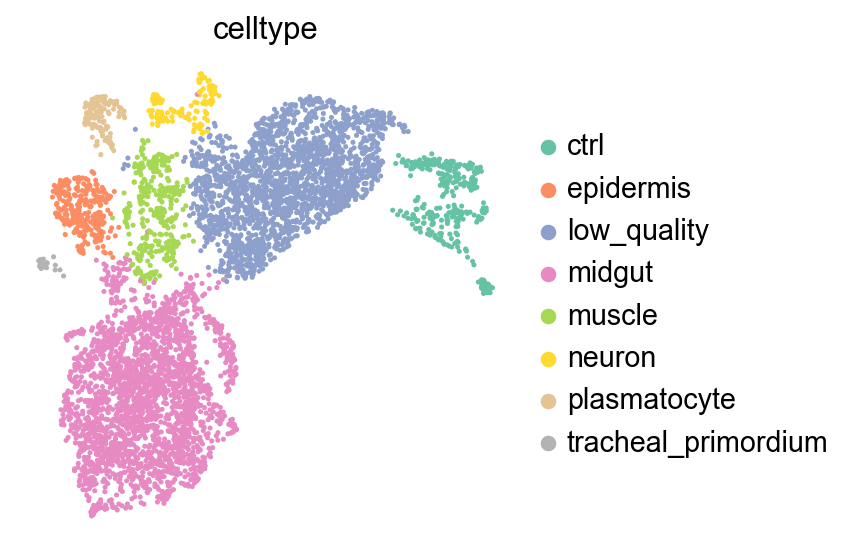

In [532]:
sc.pl.umap(adata_har, color='celltype', palette='Set2', show=False, frameon=False)
plt.savefig(
    "../figures/wt_harmony_woframe.pdf",
    bbox_inches="tight",
    dpi=300
)

In [ ]:
adata_seu.write('chips_seu.h5ad')
adata_har.write('chips_har.h5ad')
adata_bbk.write('chips_bbk.h5ad')
adata_sca.write('chips_sca.h5ad')
adata_scvi.write('chips_scvi.h5ad')

In [ ]:
midgut_bbk.write('midgut_bbk.h5ad')
midgut_har.write('midgut_har.h5ad')
midgut_sca.write('midgut_sca.h5ad')
midgut_scvi.write('midgut_scvi.h5ad')
midgut_seu.write('midgut_seu.h5ad')